# **DATA LOADING**

# Stellar Classification Data Analysis – Full Walkthrough with Explanations
# This notebook explores and analyzes stellar classification data using the Gaia dataset. We aim to extract meaningful relationships between stellar features (like temperature, radius, and luminosity) for different spectral classes (O, B, A, F, G, K, M).


# ## 🔧 1. Setup and Data Loading
# - Mount Google Drive to access dataset stored in a specific path.
# - Load the `dataGaia2.csv` dataset into a pandas DataFrame.



In [1]:
import pandas as pd
from google.colab import drive
from astropy.coordinates import SkyCoord
import astropy.units as u
drive.mount('/content/drive',force_remount=True)
path = '/content/drive/MyDrive/DataScience'
!ls $path
df_cleaned = pd.read_csv(f"{path}/dataGaia2.csv")
display(df_cleaned)
df_cleaned.info()






Mounted at /content/drive
 dataGaia2.csv				    ModelSelection_LearningCurves.ipynb
'Exploring Data Limitations-20250117'	    Pandas101
'FeatureVectors_StudentVersion (2).ipynb'   sdss_100k_galaxy_form_burst.csv
 karki_Proposal_Report.ipynb		    SDSS_DR18.csv
 LanguageModeling.ipynb


,Unnamed: 0,RA_ICRS,DE_ICRS,Source,e_RA_ICRS,e_DE_ICRS,Plx,e_Plx,PM,pmRA,...,Lum-Flame,Mass-Flame,Age-Flame,z-Flame,Evol,SpType-ELS,Flags-HS,EWHa,e_EWHa,f_EWHa
0,0,44.589012,2.195298,1306361548360576,0.0655,0.0612,0.2384,0.0769,2.901,2.088,...,298.485140,NaN,NaN,1.507248,NaN,O,92,0.02128,0.19309,0
1,1,35.358035,8.988813,23700286669971584,0.0658,0.0717,0.1666,0.0785,4.402,-0.242,...,292.672100,NaN,NaN,1.332909,NaN,O,92,0.02144,0.17600,0
2,2,44.450767,10.079118,27109837867995776,0.0627,0.0517,0.3544,0.0727,3.154,2.722,...,506.732800,NaN,NaN,1.582338,NaN,O,92,0.13726,0.13364,0
3,3,48.404909,15.105912,31009771252186752,0.0500,0.0421,0.5962,0.0557,2.745,2.460,...,9.055018,NaN,NaN,1.561845,NaN,O,93,0.09470,0.10548,0
4,4,57.092838,11.550927,36876009385300352,0.0521,0.0335,0.4507,0.0575,4.918,-2.851,...,311.502840,NaN,NaN,1.521734,NaN,O,92,0.08682,0.07831,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
626011,99995,265.014378,-32.394151,4054211323680176128,0.1134,0.0849,0.6165,0.1288,7.970,-4.134,...,13.813293,1.386,3.640,0.206649,746.0,M,94,-0.06731,0.18151,1
626012,99996,264.799179,-32.493502,4054211946505530368,0.0796,0.0672,0.1297,0.1112,3.923,-2.436,...,2276.811500,1.923,1.340,0.003901,1217.0,M,92,-0.41858,0.40188,1
626013,99997,265.136133,-32.316888,4054218573592475392,0.0688,0.0632,0.4473,0.0806,7.339,-2.913,...,286.015800,3.465,0.239,0.599263,292.0,M,93,0.03248,0.12931,0
626014,99998,265.003326,-32.277560,4054221257994693376,0.0507,0.0387,0.3639,0.0568,3.100,1.800,...,542.240050,1.950,1.292,0.007884,1288.0,M,92,0.12118,0.05450,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 626016 entries, 0 to 626015
Data columns (total 50 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  626016 non-null  int64  
 1   RA_ICRS     626016 non-null  float64
 2   DE_ICRS     626016 non-null  float64
 3   Source      626016 non-null  int64  
 4   e_RA_ICRS   626016 non-null  float64
 5   e_DE_ICRS   626016 non-null  float64
 6   Plx         626016 non-null  float64
 7   e_Plx       626016 non-null  float64
 8   PM          626016 non-null  float64
 9   pmRA        626016 non-null  float64
 10  e_pmRA      626016 non-null  float64
 11  pmDE        626016 non-null  float64
 12  e_pmDE      626016 non-null  float64
 13  RUWE        626016 non-null  float64
 14  Gmag        626015 non-null  float64
 15  e_Gmag      626015 non-null  float64
 16  BPmag       626015 non-null  float64
 17  e_BPmag     626015 non-null  float64
 18  RPmag       626016 non-null  float64
 19  e_

# Data Preprocessing and EDA


# 2. Data Overview
# - The dataset contains 626,016 rows and 50 columns.
# - Includes celestial coordinates, magnitudes, proper motions, classification probabilities, and physical parameters like Teff (Temperature), Radius, Luminosity, and Spectral Type.


#  3. Filter by Spectral Types (O to M)
# - We extract and clean rows for each spectral class.
# - Remove rows with NaN values in key columns: `Lum-Flame`, `Rad`, `Teff`, `Gmag`, `BPmag`, `RPmag`, `GMAG`, `E(BP-RP)`.


# Filter and clean per spectral class


In [2]:
df_O = df_cleaned[df_cleaned['SpType-ELS'] == 'O      ']
df_B = df_cleaned[df_cleaned['SpType-ELS'] == 'B      ']
df_A = df_cleaned[df_cleaned['SpType-ELS'] == 'A      ']
df_F = df_cleaned[df_cleaned['SpType-ELS'] == 'F      ']
df_G = df_cleaned[df_cleaned['SpType-ELS'] == 'G      ']
df_K = df_cleaned[df_cleaned['SpType-ELS'] == 'K      ']
df_M = df_cleaned[df_cleaned['SpType-ELS'] == 'M      ']




df_O = df_O.dropna(subset=['Lum-Flame','Rad','Teff','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)"])
df_B = df_B.dropna(subset=['Lum-Flame','Rad','Teff','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)"])
df_A = df_A.dropna(subset=['Lum-Flame','Rad','Teff','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)"])
df_F = df_F.dropna(subset=['Lum-Flame','Rad','Teff','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)"])
df_G = df_G.dropna(subset=['Lum-Flame','Rad','Teff','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)"])
df_K = df_K.dropna(subset=['Lum-Flame','Rad','Teff','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)"])
df_M = df_M.dropna(subset=['Lum-Flame','Rad','Teff','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)"])



# Display statistics for Luminosity for each type
display(df_O[['Lum-Flame']].describe())
display(df_B[['Lum-Flame']].describe())
display(df_A[['Lum-Flame']].describe())
display(df_F[['Lum-Flame']].describe())
display(df_G[['Lum-Flame']].describe())
display(df_K[['Lum-Flame']].describe())
display(df_M[['Lum-Flame']].describe())


,Lum-Flame
count,15685.000000
mean,670.891573
std,687.360339
min,0.208719
25%,210.118070
50%,448.615630
75%,800.486600
max,3499.921000


,Lum-Flame
count,95608.000000
mean,188.178213
std,362.883445
min,0.253439
25%,39.479337
50%,76.724645
75%,166.024010
max,3498.170000


,Lum-Flame
count,100000.000000
mean,28.527392
std,34.823844
min,0.235342
25%,11.190627
50%,18.611211
75%,33.105038
max,2962.311500


,Lum-Flame
count,100000.000000
mean,4.785248
std,8.909030
min,0.142216
25%,2.054222
50%,3.221100
75%,5.312848
max,1138.523800


,Lum-Flame
count,100000.000000
mean,6.241169
std,23.741769
min,0.067269
25%,1.015616
50%,1.737324
75%,2.958870
max,1460.798300


,Lum-Flame
count,100000.000000
mean,38.104722
std,54.961040
min,0.042415
25%,2.579316
50%,19.293565
75%,55.559632
max,2514.456000


,Lum-Flame
count,99999.000000
mean,337.913799
std,566.256105
min,0.034732
25%,0.067682
50%,51.445084
75%,423.948230
max,3499.719500


In [3]:
display(df_O.isna().sum())

,0
Unnamed: 0,0
RA_ICRS,0
DE_ICRS,0
Source,0
e_RA_ICRS,0
e_DE_ICRS,0
Plx,0
e_Plx,0
PM,0
pmRA,0



# . Log Transformations for Numerical Stability
 Log transform `Teff`, `Rad`, and `Lum-Flame` to normalize the distributions.
 An offset is added to avoid log(0).





In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

offset_teff = df_O["Teff"][df_O["Teff"] > 0].min() * 0.01

# 2. Compute log10(Teff + offset) and store in a new column:
df_O["Teff_log"] = np.log10(df_O["Teff"] + offset_teff)


offset_teff = df_B["Teff"][df_B["Teff"] > 0].min() * 0.01
df_B["Teff_log"] = np.log10(df_B["Teff"] + offset_teff)

offset_teff = df_A["Teff"][df_A["Teff"] > 0].min() * 0.01
df_A["Teff_log"] = np.log10(df_A["Teff"] + offset_teff)

offset_teff = df_F["Teff"][df_F["Teff"] > 0].min() * 0.01
df_F["Teff_log"] = np.log10(df_F["Teff"] + offset_teff)

offset_teff = df_G["Teff"][df_G["Teff"] > 0].min() * 0.01
df_G["Teff_log"] = np.log10(df_G["Teff"] + offset_teff)

offset_teff = df_K["Teff"][df_K["Teff"] > 0].min() * 0.01
df_K["Teff_log"] = np.log10(df_K["Teff"] + offset_teff)

offset_teff = df_M["Teff"][df_M["Teff"] > 0].min() * 0.01
df_M["Teff_log"] = np.log10(df_M["Teff"] + offset_teff)


offset_rad = df_O["Rad"][df_O["Rad"] > 0].min() * 0.01
df_O["Rad-log"] = np.log10(df_O["Rad"] + offset_rad)
small_value = df_O["Lum-Flame"][df_O["Lum-Flame"] > 0].min() * 0.01
df_O["Lum-Flame-Log"] = np.log10(df_O["Lum-Flame"] + small_value)


offset_rad = df_B["Rad"][df_B["Rad"] > 0].min() * 0.01
df_B["Rad-log"] = np.log10(df_B["Rad"] + offset_rad)
small_value = df_B["Lum-Flame"][df_B["Lum-Flame"] > 0].min() * 0.01
df_B["Lum-Flame-Log"] = np.log10(df_B["Lum-Flame"] + small_value)


offset_rad = df_A["Rad"][df_A["Rad"] > 0].min() * 0.01
df_A["Rad-log"] = np.log10(df_A["Rad"] + offset_rad)
small_value = df_A["Lum-Flame"][df_A["Lum-Flame"] > 0].min() * 0.01
df_A["Lum-Flame-Log"] = np.log10(df_A["Lum-Flame"] + small_value)



offset_rad = df_F["Rad"][df_F["Rad"] > 0].min() * 0.01
df_F["Rad-log"] = np.log10(df_F["Rad"] + offset_rad)
small_value = df_F["Lum-Flame"][df_F["Lum-Flame"] > 0].min() * 0.01
df_F["Lum-Flame-Log"] = np.log10(df_F["Lum-Flame"] + small_value)



offset_rad = df_G["Rad"][df_G["Rad"] > 0].min() * 0.01
df_G["Rad-log"] = np.log10(df_G["Rad"] + offset_rad)
small_value = df_G["Lum-Flame"][df_G["Lum-Flame"] > 0].min() * 0.01
df_G["Lum-Flame-Log"] = np.log10(df_G["Lum-Flame"] + small_value)



offset_rad = df_K["Rad"][df_K["Rad"] > 0].min() * 0.01
df_K["Rad-log"] = np.log10(df_K["Rad"] + offset_rad)
small_value = df_K["Lum-Flame"][df_K["Lum-Flame"] > 0].min() * 0.01
df_K["Lum-Flame-Log"] = np.log10(df_K["Lum-Flame"] + small_value)



offset_rad = df_M["Rad"][df_M["Rad"] > 0].min() * 0.01
df_M["Rad-log"] = np.log10(df_M["Rad"] + offset_rad)
small_value = df_M["Lum-Flame"][df_M["Lum-Flame"] > 0].min() * 0.01
df_M["Lum-Flame-Log"] = np.log10(df_M["Lum-Flame"] + small_value)






#  . Histograms of Log Luminosity
 - Histogram + KDE plots show distribution of `Lum-Flame-Log` per spectral type.

1.   List item
2.   List item





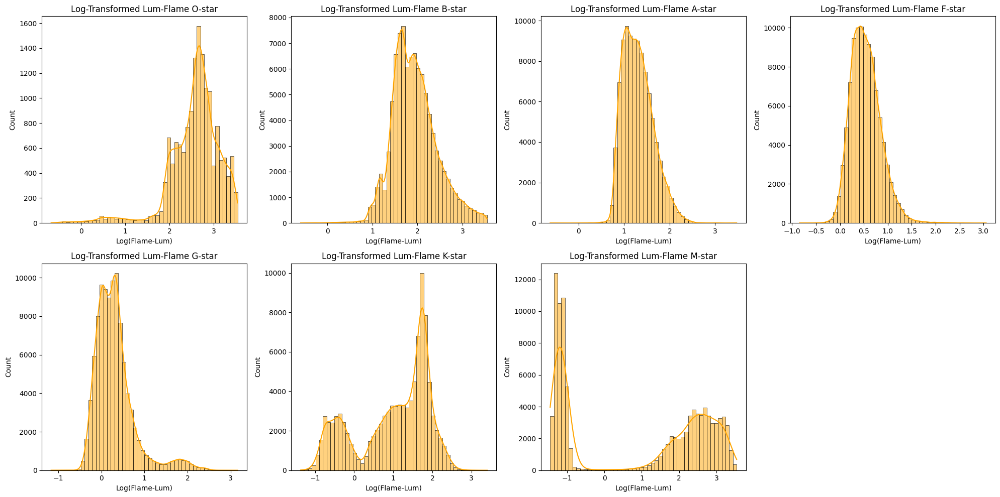

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns



fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharex=False, sharey=False)


dfs = [df_O, df_B, df_A, df_F, df_G, df_K, df_M]
titles = [
    "O-star",
    "B-star",
    "A-star",
    "F-star",
    "G-star",
    "K-star",
    "M-star",
]


axes_flat = axes.flatten()

for idx, (df, title) in enumerate(zip(dfs, titles)):
    sns.histplot(
        data=df,
        x="Lum-Flame-Log",
        bins=50,
        kde=True,
        color="orange",
        ax=axes_flat[idx]
    )
    axes_flat[idx].set_title(f"Log-Transformed Lum-Flame {title}")
    axes_flat[idx].set_xlabel("Log(Flame-Lum)")
    axes_flat[idx].set_ylabel("Count")

# Hide the 8th subplot (since you only have 7 classes)
axes_flat[-1].set_visible(False)

plt.tight_layout()
plt.show()


#Luminosity vs Radius (Scatter Plots)
 - Visualize relationship between log-radius and log-luminosity for all types.

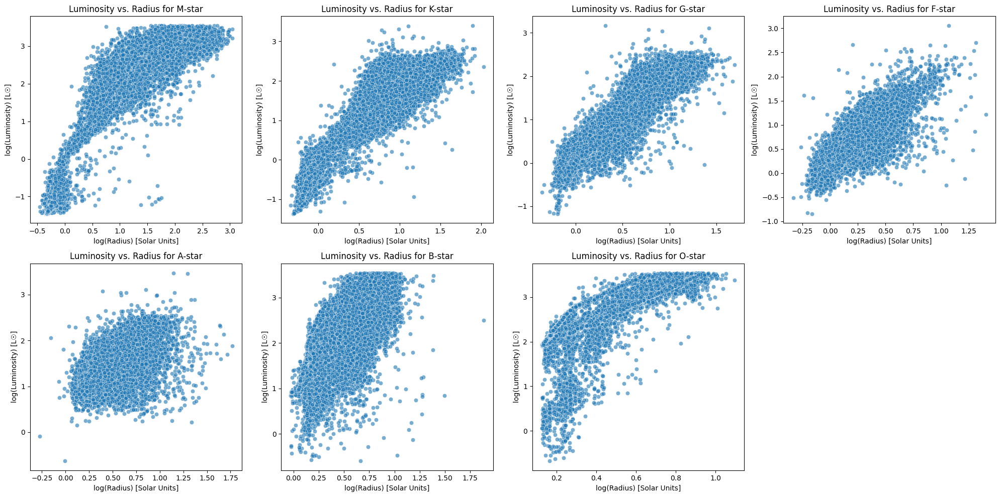

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1) Create a 2x4 grid of subplots (8 total), larger figure
fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharex=False, sharey=False)

# 2) Put your DataFrames and titles in lists
dfs = [df_M, df_K, df_G, df_F, df_A, df_B, df_O]
titles = [
    "M-star",
    "K-star",
    "G-star",
    "F-star",
    "A-star",
    "B-star",
    "O-star",
]

# Flatten the 2D `axes` array so we can iterate easily
axes_flat = axes.flatten()

# 3) Loop through each dataframe & axis
for idx, (df, title) in enumerate(zip(dfs, titles)):
    sns.scatterplot(
        x="Rad-log",
        y="Lum-Flame-Log",
        data=df,
        alpha=0.6,
        ax=axes_flat[idx]
    )
    axes_flat[idx].set_title(f"Luminosity vs. Radius for {title}")
    axes_flat[idx].set_xlabel("log(Radius) [Solar Units]")
    axes_flat[idx].set_ylabel("log(Luminosity) [L☉]")

# 4) Hide the extra 8th subplot (since you only have 7 classes)
axes_flat[-1].set_visible(False)

# 5) Adjust layout so subplots don't overlap
plt.tight_layout()
plt.show()


# Outlier Detection with Z-Score
Detect and remove outliers in the Lum-Flame-Log and Rad-log features using Z-score. Outliers are defined as points more than 3 standard deviations away from the mean. This helps improve the quality of visualizations and model training.

In [7]:
from scipy.stats import zscore
df_O["Lum_log_z"] = zscore(df_O["Lum-Flame-Log"])
df_O["Rad_log_z"] = zscore(df_O["Rad-log"])
z_threshold = 3.0
df_O["Z_outlier"] = (
    (df_O["Lum_log_z"].abs() > z_threshold) |
    (df_O["Rad_log_z"].abs() > z_threshold)
)
print(df_O[df_O["Z_outlier"]][["Lum-Flame-Log", "Rad-log"]].describe())


print(f"Total number of outliers detected: {df_O['Z_outlier'].sum()}")


       Lum-Flame-Log     Rad-log
count     397.000000  397.000000
mean        0.413330    0.230861
std         0.387483    0.077248
min        -0.676116    0.126699
25%         0.223717    0.176742
50%         0.489337    0.231864
75%         0.678971    0.267816
max         3.376152    1.096877
Total number of outliers detected: 397


#  Remove Outliers Across All Spectral Classes
Apply the Z-score based outlier removal function to all seven spectral class datasets to obtain cleaned versions with less noise

In [8]:
def remove_outliers_zscore(df, lum_col="Lum-Flame-Log", rad_col="Rad-log", threshold=3.0):


    df["Lum_log_z"] = zscore(df[lum_col])
    df["Rad_log_z"] = zscore(df[rad_col])


    df["z_outlier"] = (
        (df["Lum_log_z"].abs() > threshold) |
        (df["Rad_log_z"].abs() > threshold)
    )


    df_no_outliers = df[~df["z_outlier"]].copy()

    return df_no_outliers


df_O_no_outliers = remove_outliers_zscore(df_O)


df_B_no_outliers = remove_outliers_zscore(df_B)
df_A_no_outliers = remove_outliers_zscore(df_A)
df_F_no_outliers = remove_outliers_zscore(df_F)
df_G_no_outliers = remove_outliers_zscore(df_G)
df_K_no_outliers = remove_outliers_zscore(df_K)
df_M_no_outliers = remove_outliers_zscore(df_M)

# Updated Scatter Plots Without Outliers
Visualize the cleaned data by plotting Lum-Flame-Log vs Rad-log again. This helps observe the clearer relationships after removing extreme value


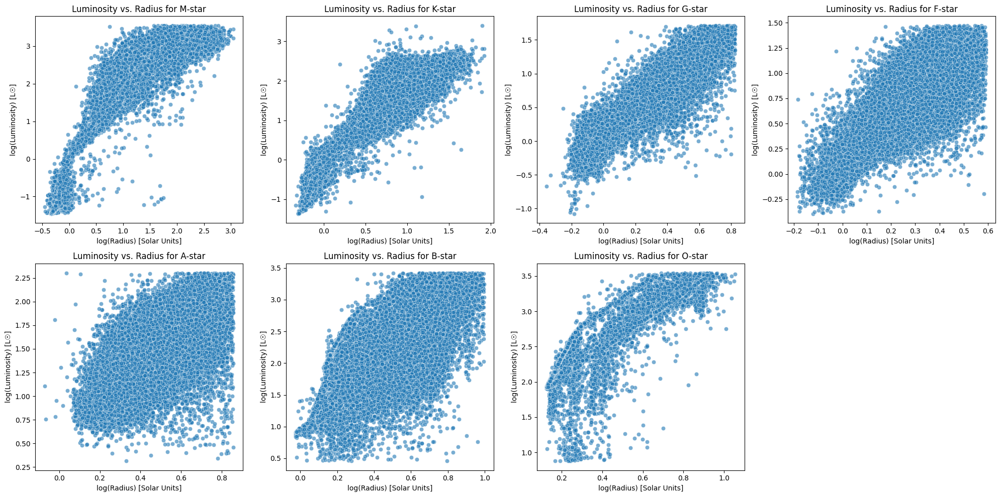

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1) Create a 2x4 grid of subplots (8 total), larger figure
fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharex=False, sharey=False)

# 2) Put your DataFrames and titles in lists
dfs = [df_M_no_outliers, df_K_no_outliers, df_G_no_outliers, df_F_no_outliers, df_A_no_outliers, df_B_no_outliers, df_O_no_outliers]
titles = [
    "M-star",
    "K-star",
    "G-star",
    "F-star",
    "A-star",
    "B-star",
    "O-star",
]

# Flatten the 2D `axes` array so we can iterate easily
axes_flat = axes.flatten()

# 3) Loop through each dataframe & axis
for idx, (df, title) in enumerate(zip(dfs, titles)):
    sns.scatterplot(
        x="Rad-log",
        y="Lum-Flame-Log",
        data=df,
        alpha=0.6,
        ax=axes_flat[idx]
    )
    axes_flat[idx].set_title(f"Luminosity vs. Radius for {title}")
    axes_flat[idx].set_xlabel("log(Radius) [Solar Units]")
    axes_flat[idx].set_ylabel("log(Luminosity) [L☉]")

# 4) Hide the extra 8th subplot (since you only have 7 classes)
axes_flat[-1].set_visible(False)

# 5) Adjust layout so subplots don't overlap
plt.tight_layout()
plt.show()


# Combine Cleaned Data Across All Classes
Create a unified dataset from all cleaned classes and add a new Class column indicating spectral type. This prepares the dataset for comparative analysis and classification tasks.

In [10]:
O_data = df_O_no_outliers[["Lum-Flame",'Lum-Flame-Log','Teff','PWD','Rad','Rad-log','Teff_log','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)",'logg','[Fe/H]','Plx','PM','Dist','ABP','ARP']].copy()
O_data['Class'] = 'O-stars'

B_data = df_B_no_outliers[["Lum-Flame",'Lum-Flame-Log','Teff','PWD','Rad','Rad-log','Teff_log','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)",'logg','[Fe/H]','Plx','PM','Dist','ABP','ARP']].copy()
B_data['Class'] = 'B-stars'

A_data = df_A_no_outliers[["Lum-Flame",'Lum-Flame-Log','Teff','PWD','Rad','Rad-log','Teff_log','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)",'logg','[Fe/H]','Plx','PM','Dist','ABP','ARP']].copy()
A_data['Class'] = 'A-stars'

F_data = df_F_no_outliers[["Lum-Flame",'Lum-Flame-Log','Teff','PWD','Rad','Rad-log','Teff_log','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)",'logg','[Fe/H]','Plx','PM','Dist','ABP','ARP']].copy()
F_data['Class'] = 'F-stars'

G_data = df_G_no_outliers[["Lum-Flame",'Lum-Flame-Log','Teff','PWD','Rad','Rad-log','Teff_log','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)",'logg','[Fe/H]','Plx','PM','Dist','ABP','ARP']].copy()
G_data['Class'] = 'G-stars'

K_data = df_K_no_outliers[["Lum-Flame",'Lum-Flame-Log','Teff','PWD','Rad','Rad-log','Teff_log','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)",'logg','[Fe/H]','Plx','PM','Dist','ABP','ARP']].copy()
K_data['Class'] = 'K-stars'

M_data = df_M_no_outliers[["Lum-Flame",'Lum-Flame-Log','Teff','PWD','Rad','Rad-log','Teff_log','Gmag','BPmag', 'RPmag',"GMAG","E(BP-RP)",'logg','[Fe/H]','Plx','PM','Dist','ABP','ARP']].copy()
M_data['Class'] = 'M-stars'

combined_data = pd.concat([O_data, B_data, A_data, F_data, G_data, K_data, M_data], ignore_index=True)


display(combined_data)


,Lum-Flame,Lum-Flame-Log,Teff,PWD,Rad,Rad-log,Teff_log,Gmag,BPmag,RPmag,GMAG,E(BP-RP),logg,[Fe/H],Plx,PM,Dist,ABP,ARP,Class
0,298.485140,2.474926,18148.6110,0.999948,1.6635,0.224468,4.262418,16.908537,16.761435,17.134040,0.3894,0.0041,4.5728,-0.9759,0.2384,2.901,19867.7480,0.0088,0.0047,O-stars
1,292.672100,2.466384,17500.2360,0.999948,1.7470,0.245574,4.246751,16.962143,16.841173,17.193855,0.3548,0.0038,4.4948,-1.1661,0.1666,4.402,21021.8960,0.0082,0.0044,O-stars
2,506.732800,2.704781,19761.3630,0.999950,1.8439,0.268847,4.299101,16.407494,16.382404,16.429598,0.0162,0.2696,4.5526,-0.9919,0.3544,3.154,14943.4340,0.5830,0.3134,O-stars
3,9.055018,0.956989,19486.8000,0.000002,1.8604,0.272688,4.293071,15.607131,15.497600,15.672352,0.0268,0.1260,4.5211,-0.9392,0.5962,2.745,11625.3320,0.2718,0.1457,O-stars
4,311.502840,2.493465,18453.3460,0.999950,1.6652,0.224908,4.269591,16.372738,16.354900,16.384790,0.3626,0.2796,4.5807,-0.9965,0.4507,4.918,12459.0440,0.6062,0.3267,O-stars
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603707,13.813293,1.140308,4795.5200,0.000000,2.9741,0.473860,3.683579,15.136189,16.283280,13.908625,3.2470,1.2409,3.4916,0.1914,0.6165,7.970,799.4192,3.0893,1.8487,M-stars
603708,2276.811500,3.357327,3693.1008,0.000000,117.6631,2.070653,3.570951,16.242880,20.598213,14.574429,-2.8667,3.4804,0.1911,-0.8501,0.1297,3.923,4607.0234,8.6747,5.1878,M-stars
603709,286.015800,2.456391,10367.2170,0.000000,2.7057,0.432834,4.016933,15.603966,17.062696,14.316659,0.3081,2.9332,4.0372,0.7552,0.4473,7.339,1029.7885,6.8761,3.9422,M-stars
603710,542.240050,2.734192,3586.8994,0.000000,72.4356,1.859973,3.558384,12.808980,15.358428,11.391167,-1.3028,1.7271,0.6830,-0.2191,0.3639,3.100,1850.7625,4.1371,2.4100,M-stars


# Correlation Between Temperature and Luminosity
Use the full dataset to examine the relationship between temperature (Teff) and luminosity (Lum-Flame). This helps validate the Stefan-Boltzmann law trend in stellar physics

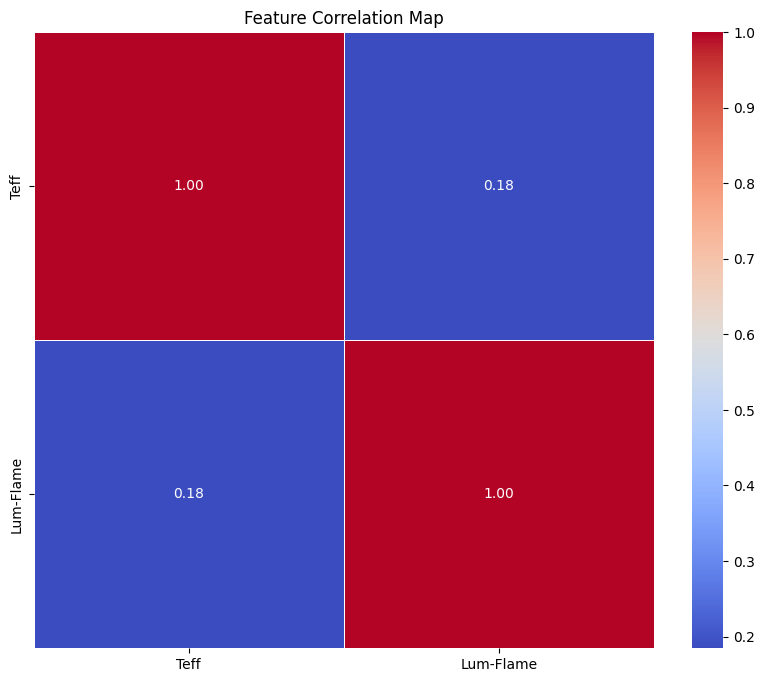

In [11]:
df_numeric = df_cleaned.select_dtypes(include=[float, int])


corr_matrix = df_numeric[['Teff', 'Lum-Flame']].corr()




plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Map")
plt.show()

# Violin Plot of Luminosity per Class
Visualize the distribution of Lum-Flame-Log across all spectral classes using a violin plot. This highlights how brightness changes with stellar type.

<ipython-input-12-88a26e8d6457>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data= combined_data, x='Class', y='Lum-Flame-Log', scale='width', inner='quartile',palette='Set2')
<ipython-input-12-88a26e8d6457>:2: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data= combined_data, x='Class', y='Lum-Flame-Log', scale='width', inner='quartile',palette='Set2')


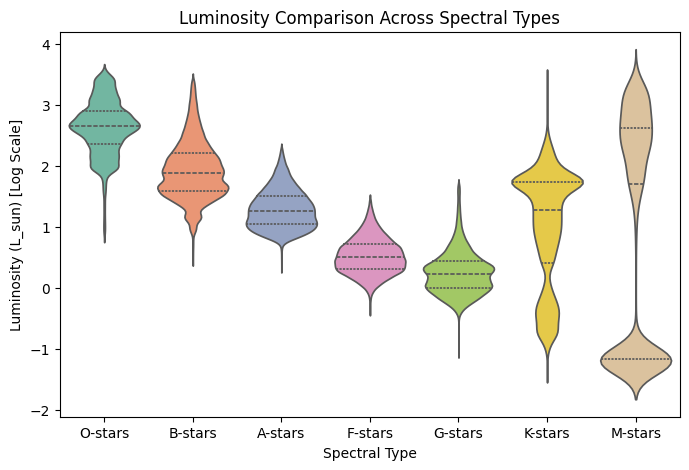

In [12]:


plt.figure(figsize=(8, 5))
sns.violinplot(data= combined_data, x='Class', y='Lum-Flame-Log', scale='width', inner='quartile',palette='Set2')

plt.title("Luminosity Comparison Across Spectral Types")
plt.ylabel("Luminosity (L_sun) [Log Scale]")
plt.xlabel("Spectral Type")
plt.show()

# Temperature Distribution
Compare the temperature (Teff_log) across classes using both histogram and violin plots. This shows the expected trend where O-stars are hotter than M-stars.

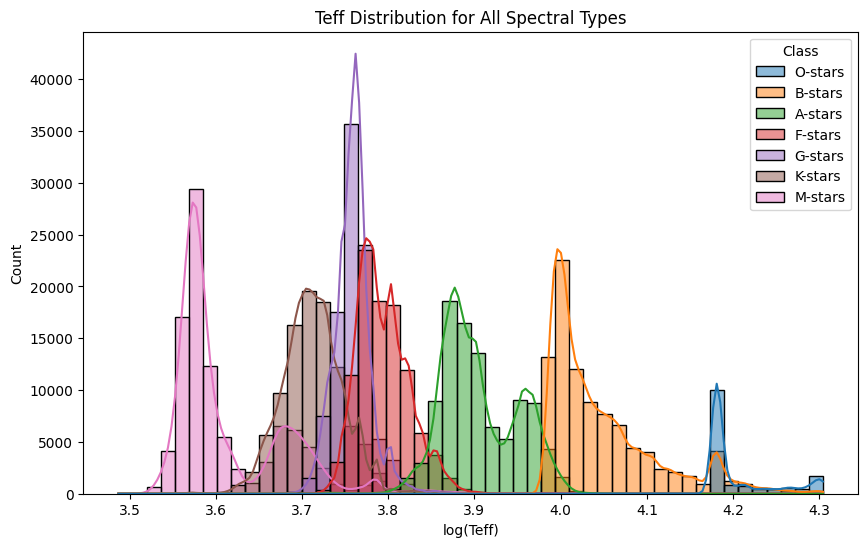

In [13]:

plt.figure(figsize=(10,6))
sns.histplot(
    data= combined_data,
    x="Teff_log",
    hue="Class",
    kde=True,
    palette="tab10",
    alpha=0.5,
    bins=50
)
plt.xlabel("log(Teff)")
plt.title("Teff Distribution for All Spectral Types")
plt.show()

# Violin Plot for the temperature distribution across all the classes

<ipython-input-14-d04778f8a309>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-14-d04778f8a309>:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


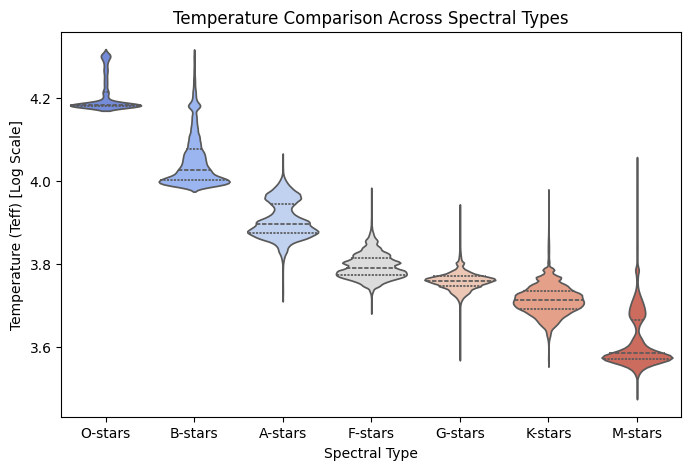

In [14]:

plt.figure(figsize=(8, 5))

sns.violinplot(
    data=combined_data,
    x='Class',
    y='Teff_log',
    scale='width',
    inner='quartile',
   palette='coolwarm'
)

plt.title("Temperature Comparison Across Spectral Types")
plt.ylabel("Temperature (Teff) [Log Scale]")
plt.xlabel("Spectral Type")
plt.show()

# Photometric Feature Correlations
Analyze correlation among Gmag, BPmag, RPmag, and GMAG to explore redundancy and relationships in photometric measurements.

           Gmag     BPmag     RPmag      GMAG
Gmag   1.000000  0.965199  0.983792  0.146473
BPmag  0.965199  1.000000  0.907379  0.091715
RPmag  0.983792  0.907379  1.000000  0.151573
GMAG   0.146473  0.091715  0.151573  1.000000


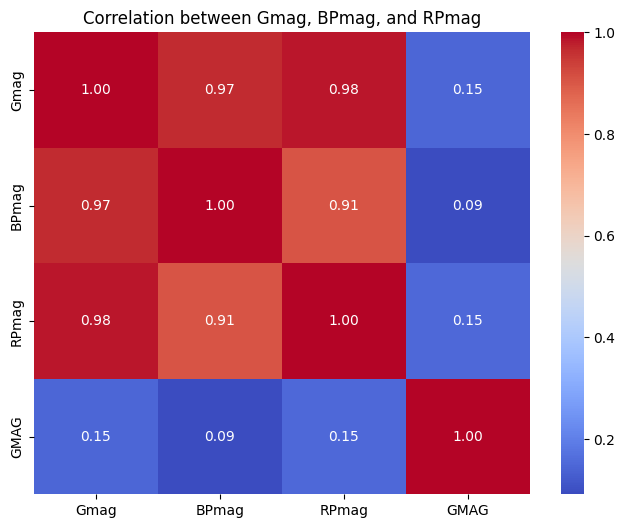

In [15]:
correlation_matrix = combined_data[['Gmag', 'BPmag', 'RPmag','GMAG']].corr()
print(correlation_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation between Gmag, BPmag, and RPmag")
plt.show()

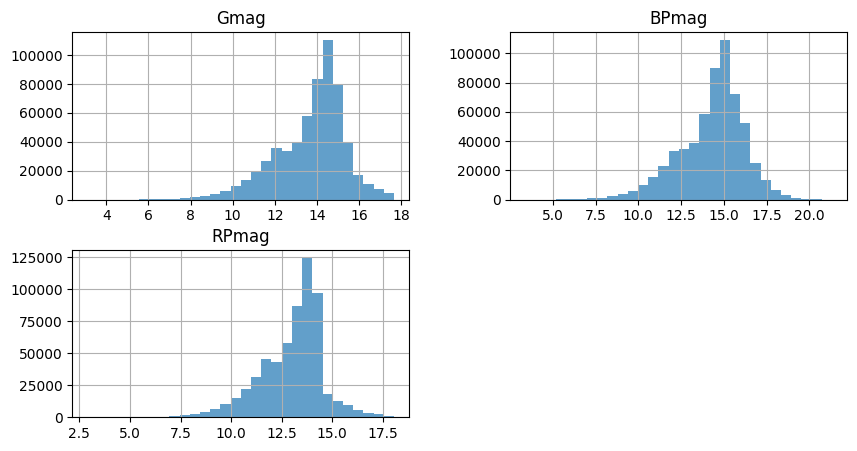

In [16]:
combined_data[['Gmag','BPmag','RPmag']].hist(bins=30, alpha=0.7, figsize=(10, 5))
plt.xlabel('Absolute Magnitude')
plt.ylabel('Frequency')
plt.title('Comparison of Absolute Magnitudes in Different Bands')
plt.legend(['Gmag', 'BPmag', 'RPmag'])
plt.show()

# Apparent vs Absolute Magnitudes
Visualize Gmag and GMAG across classes using strip plots. These show observed brightness (apparent) vs intrinsic brightness (absolute).



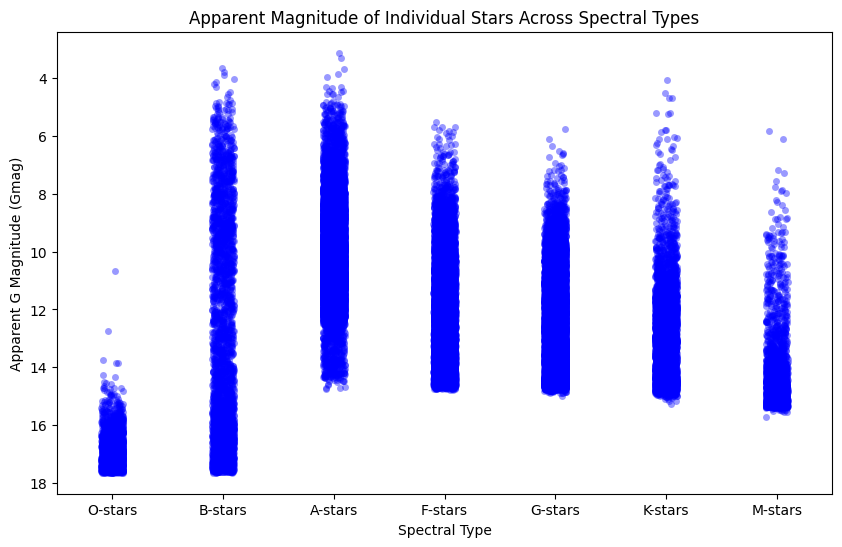

In [17]:
absolute_mag_data = combined_data[combined_data["E(BP-RP)"] < 0.1]

stellar_mag_stats = absolute_mag_data.groupby("Class")[["Gmag", "BPmag", "RPmag", "GMAG"]].mean()


plt.figure(figsize=(10,6))


sns.stripplot(data=absolute_mag_data, x='Class', y='Gmag', jitter=True, alpha=0.4, color="blue")

plt.gca().invert_yaxis()


plt.xlabel("Spectral Type")
plt.ylabel("Apparent G Magnitude (Gmag)")
plt.title("Apparent Magnitude of Individual Stars Across Spectral Types")


plt.show()


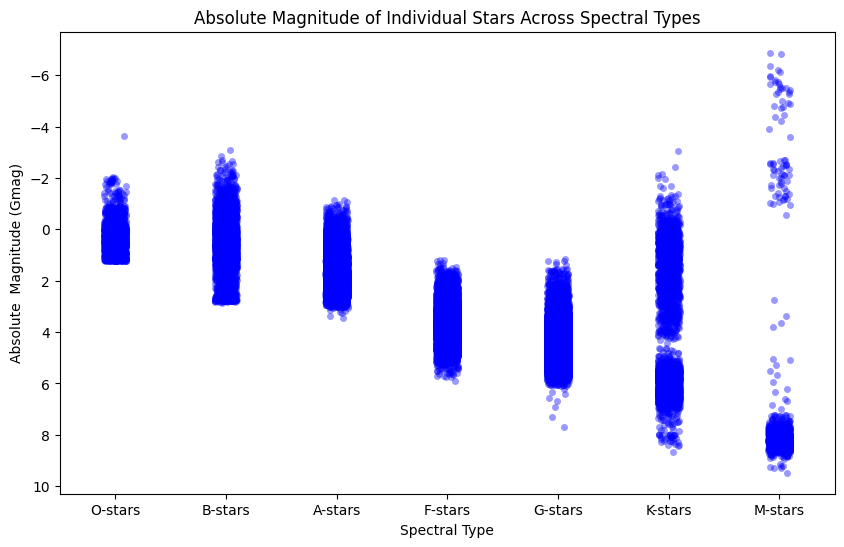

In [18]:
plt.figure(figsize=(10, 6))
sns.stripplot(data=absolute_mag_data, x='Class', y='GMAG', jitter=True, alpha=0.4, color="blue")


plt.xlabel("Spectral Type")
plt.ylabel("Absolute  Magnitude (Gmag)")
plt.title("Absolute Magnitude of Individual Stars Across Spectral Types")
plt.gca().invert_yaxis()
plt.show()

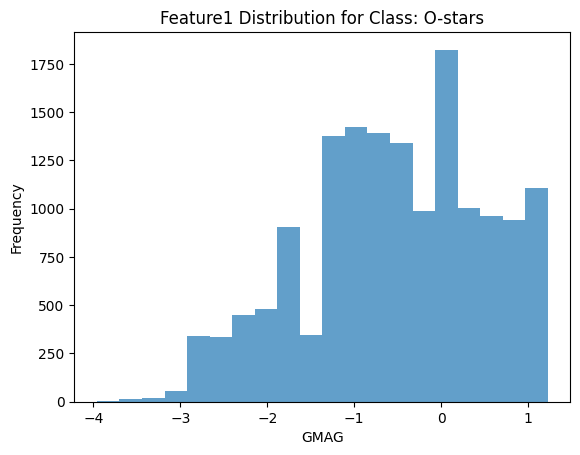

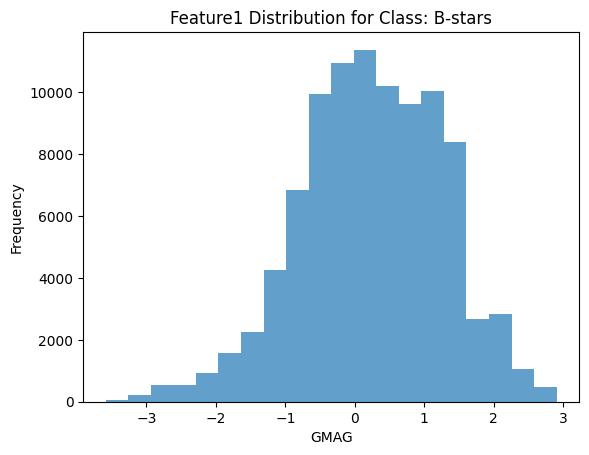

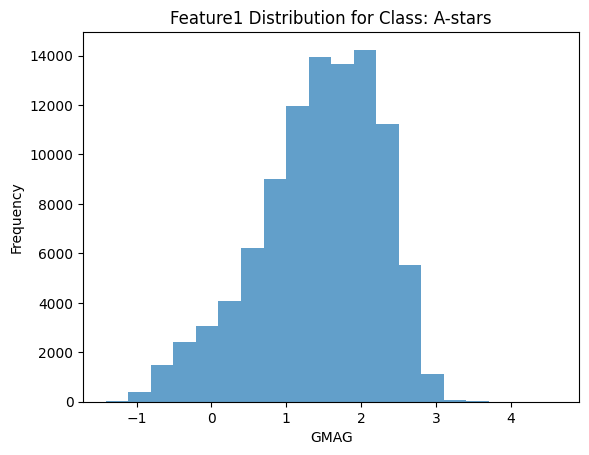

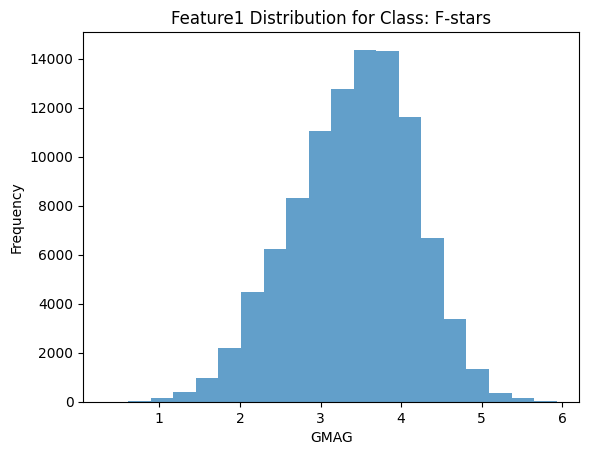

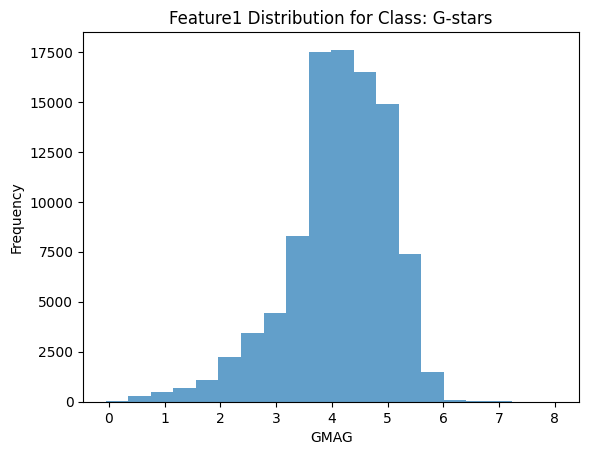

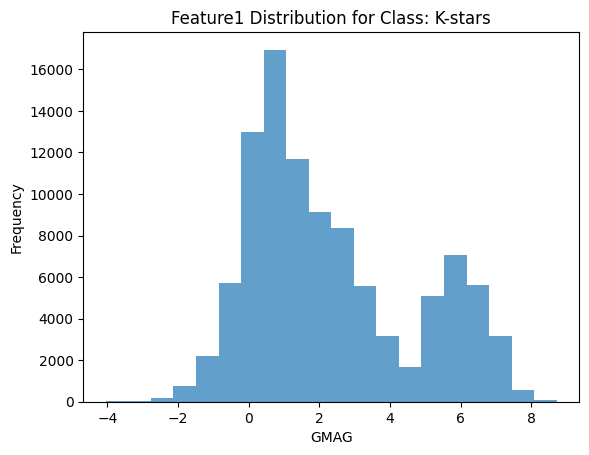

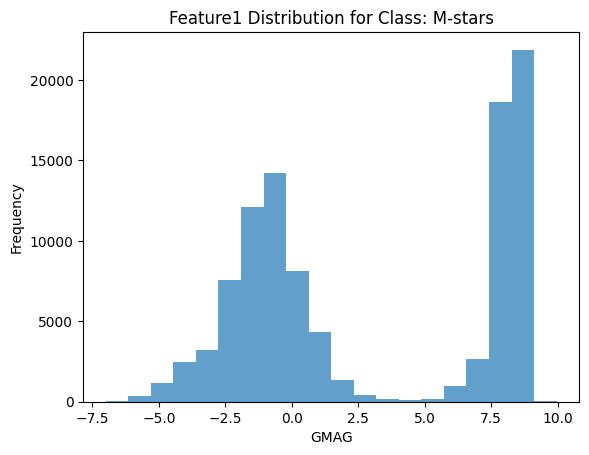

In [19]:
unique_classes = combined_data['Class'].unique()
for cls in unique_classes:
    subset = combined_data[combined_data['Class'] == cls]
    plt.hist(subset['GMAG'], bins=20, alpha=0.7)
    plt.title(f'Feature1 Distribution for Class: {cls}')
    plt.xlabel('GMAG')
    plt.ylabel('Frequency')
    plt.show()

# Coorelation between Lumonisty and Actual brightness of the star(negative GMAG refers to the more bright stars)

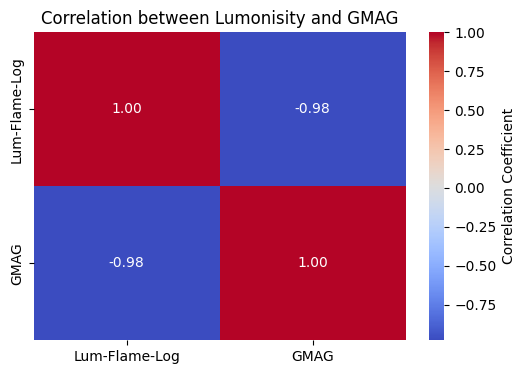

In [20]:
numeric_cols = combined_data[['Lum-Flame-Log', 'GMAG']]

# Calculate correlation matrix
correlation_matrix = numeric_cols.corr()

# Plot the heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar_kws={'label': 'Correlation Coefficient'})
plt.title("Correlation between Lumonisity and GMAG")
plt.show()

# Feature Enginnering
Create and analyze BP-RP, E(BP-RP), and corrected color index BP-RP0. These reveal the impact of interstellar reddening.



In [21]:
combined_data['BP-RP'] = combined_data['BPmag'] - combined_data['RPmag']
combined_data['BP-RP0'] =  combined_data['BP-RP'] - combined_data['E(BP-RP)']

In [22]:
from scipy.stats import zscore

def remove_outliers_zscore(df, cols, threshold=3.0):

    z_scores = df[cols].apply(zscore)  # Compute z-scores for all selected columns
    outliers = (z_scores.abs() > threshold).any(axis=1)
    df_clean = df[~outliers].copy()  # Keep only rows without outliers
    return df_clean
combined_data_df = remove_outliers_zscore(combined_data, ['logg','BP-RP0','BP-RP','Teff_log','Plx','PM','Dist','[Fe/H]'])

# Reddening Visualization

Histogram to see how Bp-Rp is distrubted along the spectral types

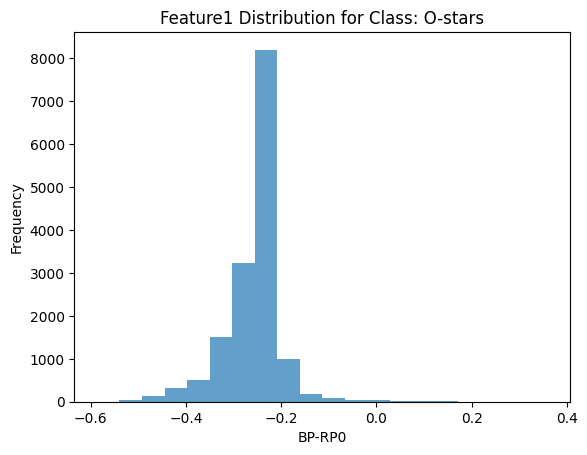

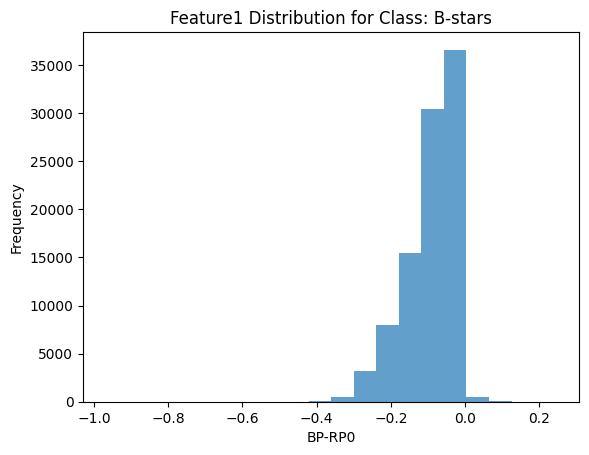

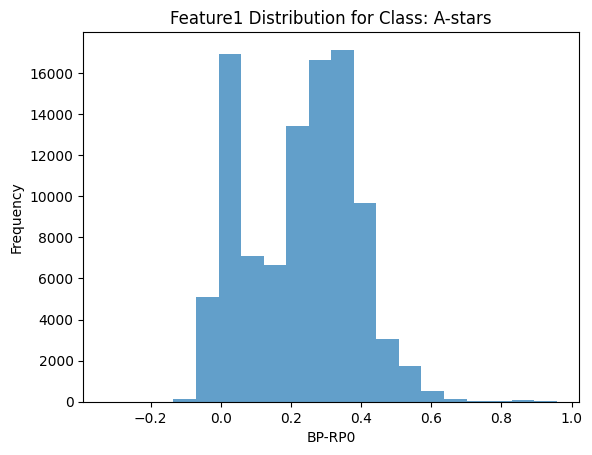

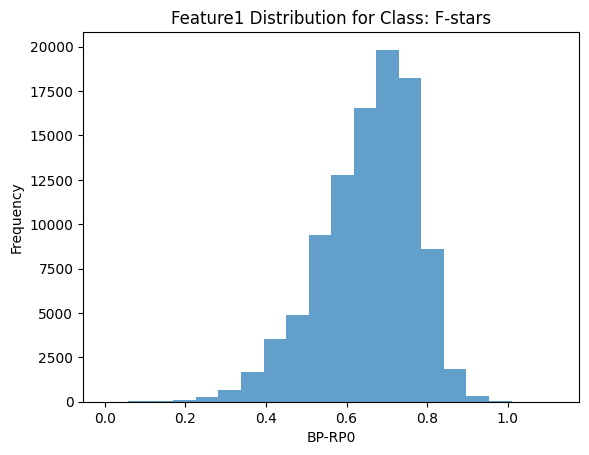

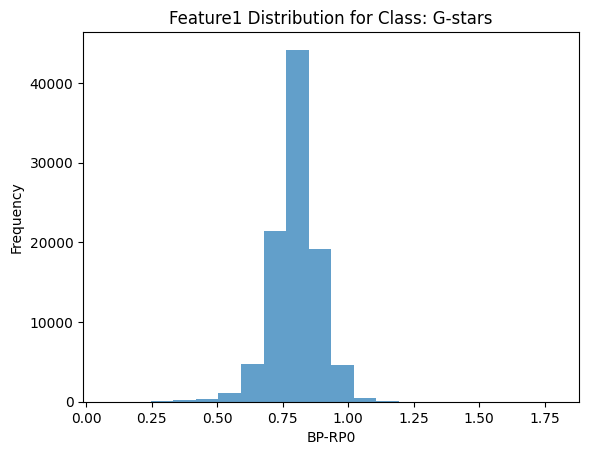

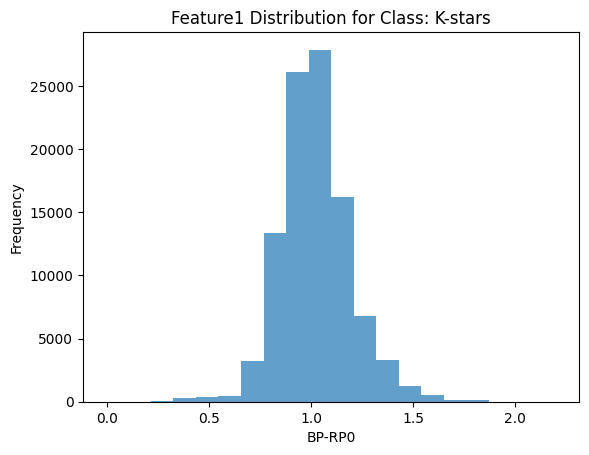

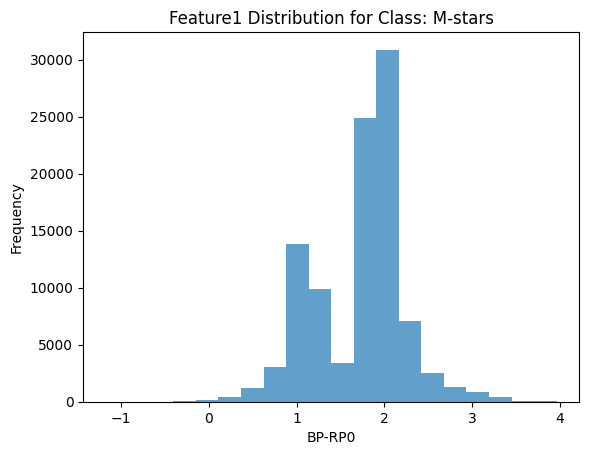

In [23]:
for cls in unique_classes:
    subset = combined_data[combined_data['Class'] == cls]
    plt.hist(subset['BP-RP0'], bins=20, alpha=0.7)
    plt.title(f'Feature1 Distribution for Class: {cls}')
    plt.xlabel('BP-RP0')
    plt.ylabel('Frequency')
    plt.show()

In [24]:
print(combined_data.groupby('Class')['BP-RP0'].describe())

           count      mean       std       min       25%       50%       75%  \
Class                                                                          
A-stars  98469.0  0.227823  0.154456 -0.327861  0.073228  0.250039  0.341622   
B-stars  94760.0 -0.092882  0.067618 -0.968655 -0.128090 -0.074059 -0.041409   
F-stars  98744.0  0.654853  0.117934  0.001996  0.582856  0.671887  0.741439   
G-stars  96453.0  0.799970  0.088013  0.075081  0.755319  0.799667  0.850132   
K-stars  99999.0  1.019302  0.173903 -0.008746  0.912481  1.008549  1.113420   
M-stars  99999.0  1.719299  0.517749 -1.174750  1.226900  1.866264  2.014797   
O-stars  15288.0 -0.256454  0.060645 -0.587093 -0.278716 -0.243884 -0.226980   

              max  
Class              
A-stars  0.957577  
B-stars  0.246571  
F-stars  1.121585  
G-stars  1.796022  
K-stars  2.202607  
M-stars  3.961059  
O-stars  0.360101  


 Histogram to see how ABP-ARP is distrubted along the spectral types


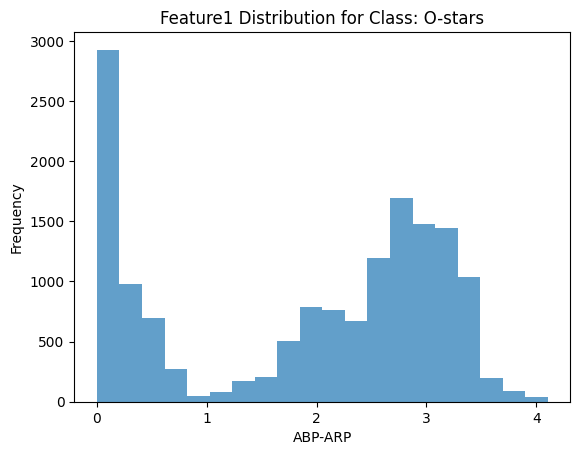

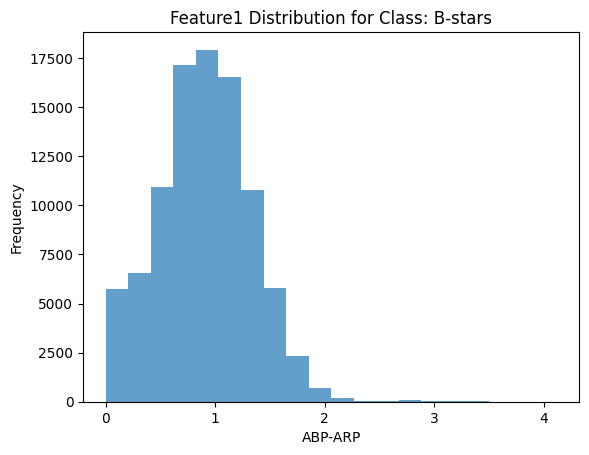

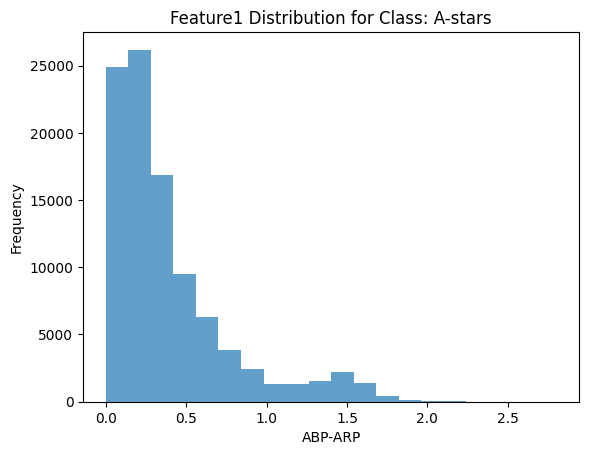

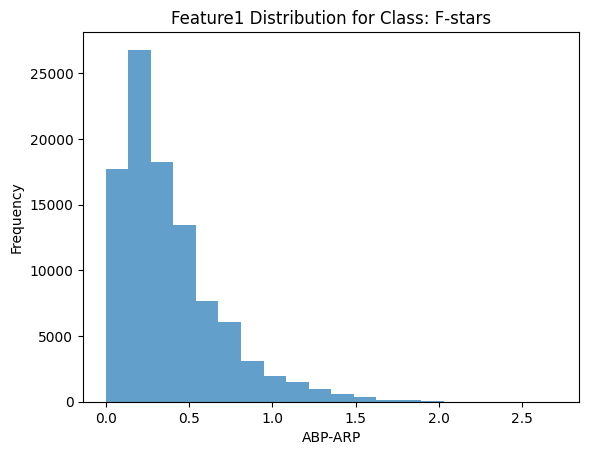

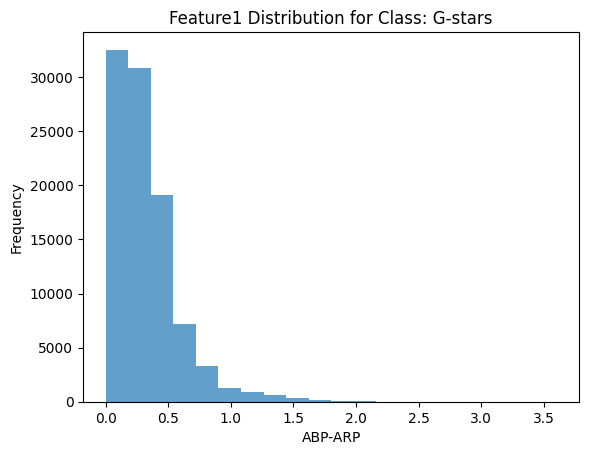

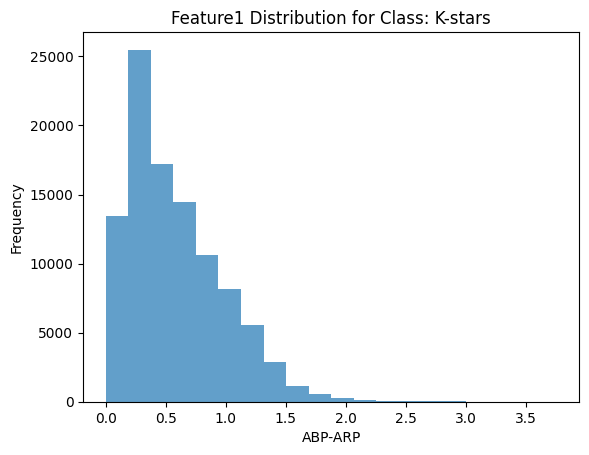

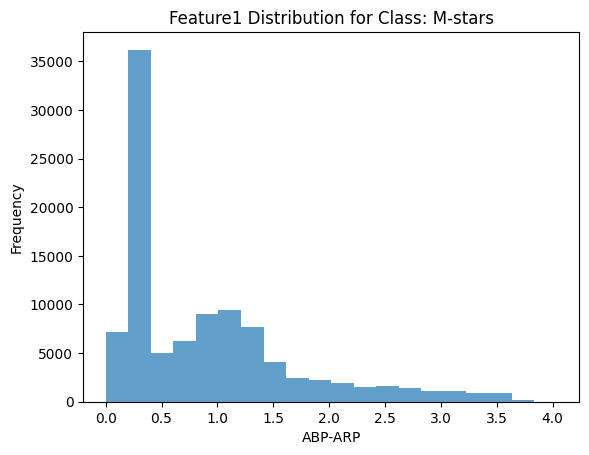

In [25]:
combined_data.dropna(subset=['ARP','ABP'])
combined_data.groupby('Class')['ABP'].describe()
combined_data['ABP - ARP'] = combined_data['ABP'] - combined_data['ARP']
combined_data.groupby('Class')['ABP - ARP'].describe()
for cls in unique_classes:
    subset = combined_data[combined_data['Class'] == cls]
    plt.hist(subset['ABP - ARP'], bins=20, alpha=0.7)
    plt.title(f'Feature1 Distribution for Class: {cls}')
    plt.xlabel('ABP-ARP')
    plt.ylabel('Frequency')
    plt.show()

Plot violin plots of corrected color index (BP-RP0) and reddening effect (ABP - ARP) across all spectral types. This aids in understanding dust effects.



# Feature Skewness and Transformation
Identify highly skewed features and apply log1p transformation to normalize them, which is essential for better modeling and visualization.

📊 Features with highest skew:
 PWD          13.753813
Rad           9.792685
PM            6.184688
Lum-Flame     4.937922
Plx           4.801038
Dist          4.296567
ARP           2.183488
ABP           2.123092
ABP - ARP     2.050504
E(BP-RP)      2.050408
dtype: float64


/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log1p
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log1p
  result = func(self.values, **kwargs)


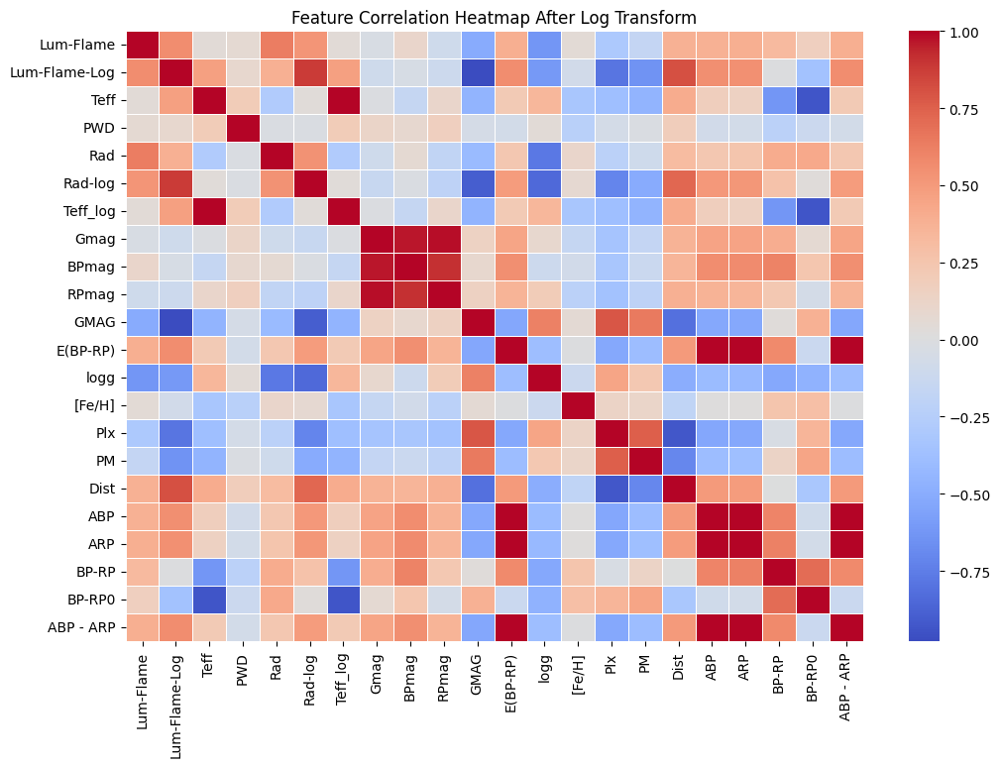

In [26]:

exclude_features = ['Class', 'Rad','Lum-Flame']


skewed_features = combined_data.drop(columns='Class').skew().sort_values(ascending=False)
print("📊 Features with highest skew:\n", skewed_features.head(10))


highly_skewed_features = skewed_features[abs(skewed_features) > 1].index.tolist()


features_to_transform = [feat for feat in highly_skewed_features if feat not in exclude_features]



combined_data[features_to_transform] = np.log1p(combined_data[features_to_transform])


corr_matrix_log = combined_data.drop(columns = "Class").corr()


plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_log, cmap="coolwarm", annot=False, fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap After Log Transform")
plt.show()


<ipython-input-27-07182fdb2217>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=combined_data, x='Class', y='BP-RP0', palette='coolwarm', inner='quartile')
<ipython-input-27-07182fdb2217>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=combined_data, x='Class', y='ABP - ARP', palette='Spectral', inner='quartile')


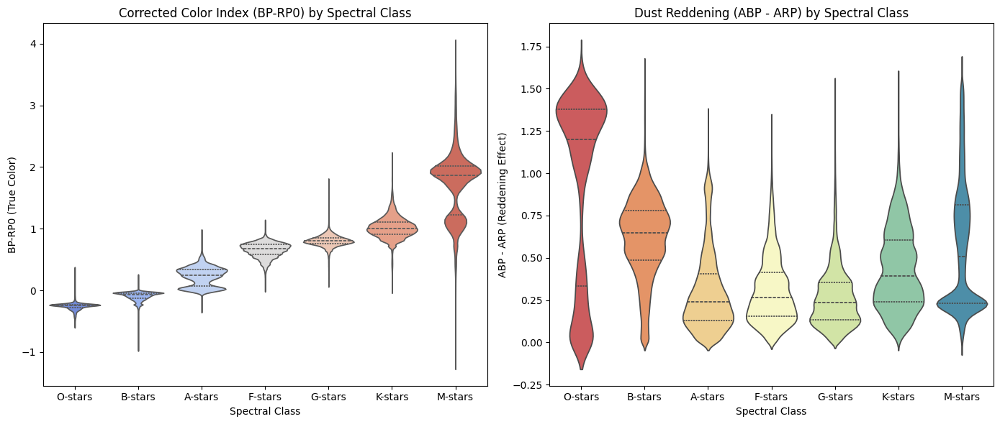

In [27]:

plt.figure(figsize=(14, 6))


plt.subplot(1, 2, 1)
sns.violinplot(data=combined_data, x='Class', y='BP-RP0', palette='coolwarm', inner='quartile')
plt.title("Corrected Color Index (BP-RP0) by Spectral Class")
plt.xlabel("Spectral Class")
plt.ylabel("BP-RP0 (True Color)")

plt.subplot(1, 2, 2)
sns.violinplot(data=combined_data, x='Class', y='ABP - ARP', palette='Spectral', inner='quartile')
plt.title("Dust Reddening (ABP - ARP) by Spectral Class")
plt.xlabel("Spectral Class")
plt.ylabel("ABP - ARP (Reddening Effect)")

plt.tight_layout()
plt.show()


# Surface Gravity (logg) Analysis
Study the distribution of logg for each class to understand stellar structure. Higher gravity generally implies smaller, denser stars.

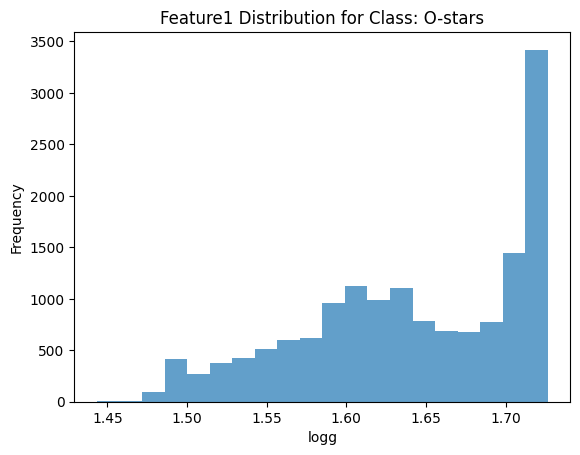

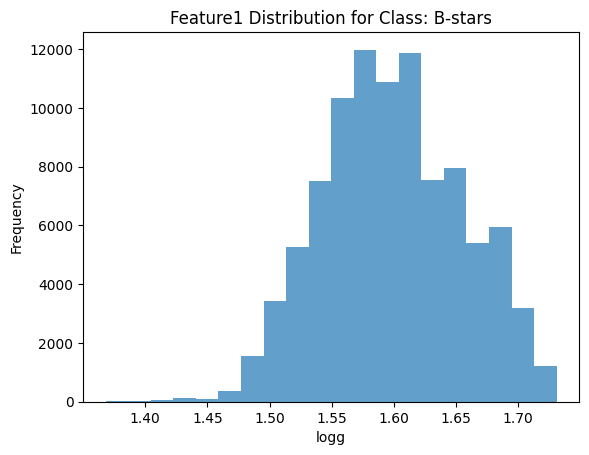

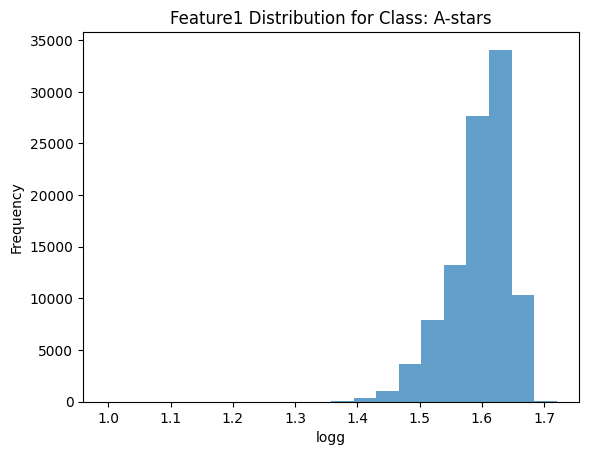

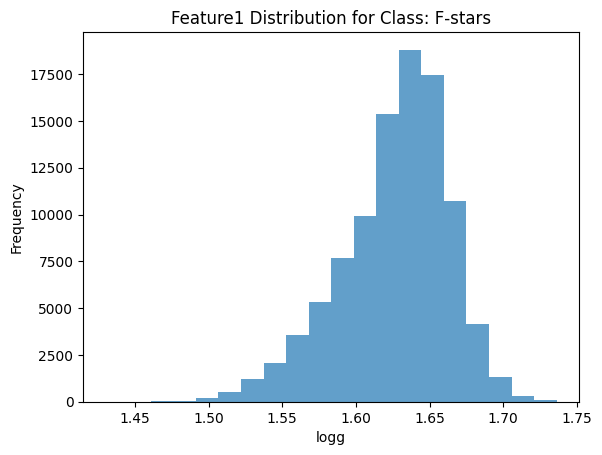

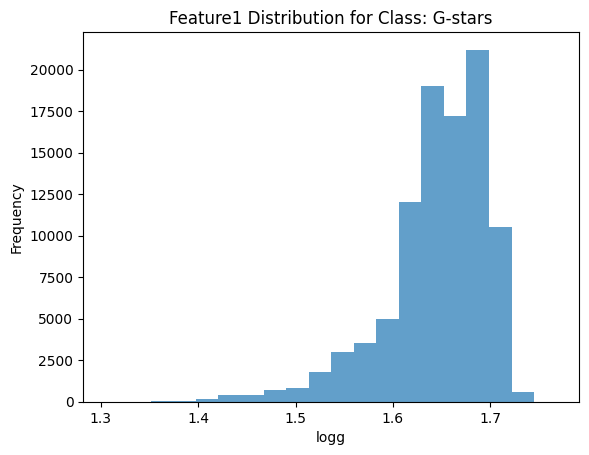

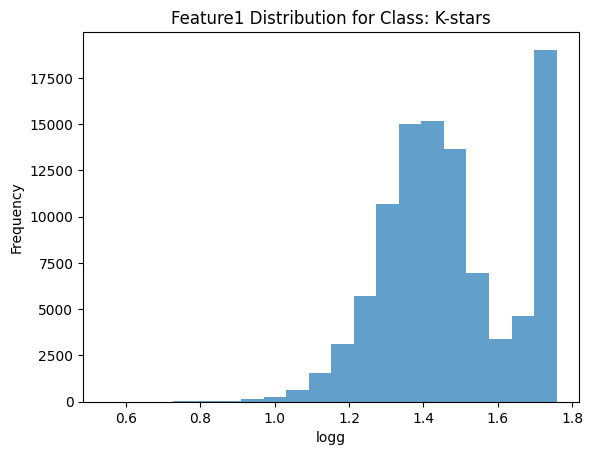

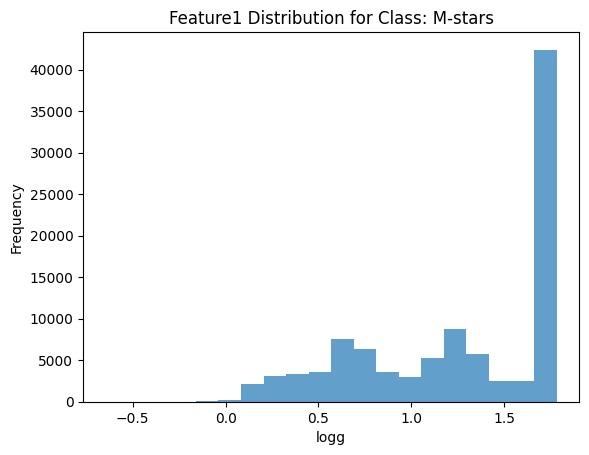

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-28-8390c4a27e19>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=combined_data, x='Class', y='logg', palette='viridis', inner='quartile')


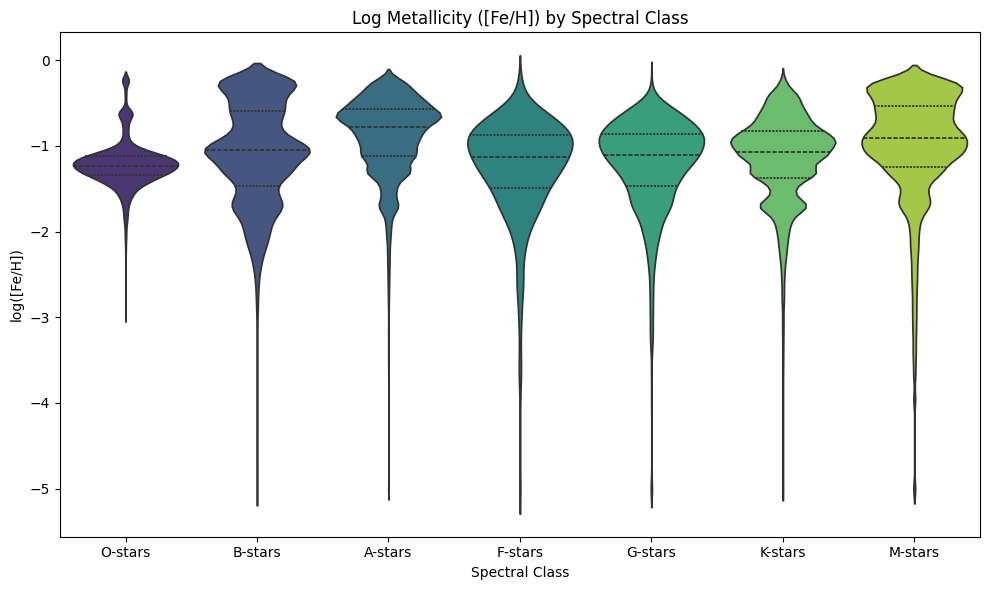

In [28]:
combined_data = combined_data.dropna(subset=['logg'])
combined_data.dropna()
combined_data.groupby('Class')['logg'].describe()
for cls in unique_classes:
    subset = combined_data[combined_data['Class'] == cls]
    plt.hist(subset['logg'], bins=20, alpha=0.7)
    plt.title(f'Feature1 Distribution for Class: {cls}')
    plt.xlabel('logg')
    plt.ylabel('Frequency')
    plt.show()



combined_data['logg'] = np.log10(combined_data['[Fe/H]'] + 1e-5)

# Plot the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(data=combined_data, x='Class', y='logg', palette='viridis', inner='quartile')
plt.title("Log Metallicity ([Fe/H]) by Spectral Class")
plt.xlabel("Spectral Class")
plt.ylabel("log([Fe/H])")
plt.tight_layout()
plt.show()


# Metallicity Analysis
Examine [Fe/H] across spectral types to assess chemical composition. This is important for understanding stellar age and evolution.

<ipython-input-29-b4f24a5e9bda>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=combined_data, x='Class', y='[Fe/H]', palette='viridis', inner='quartile')


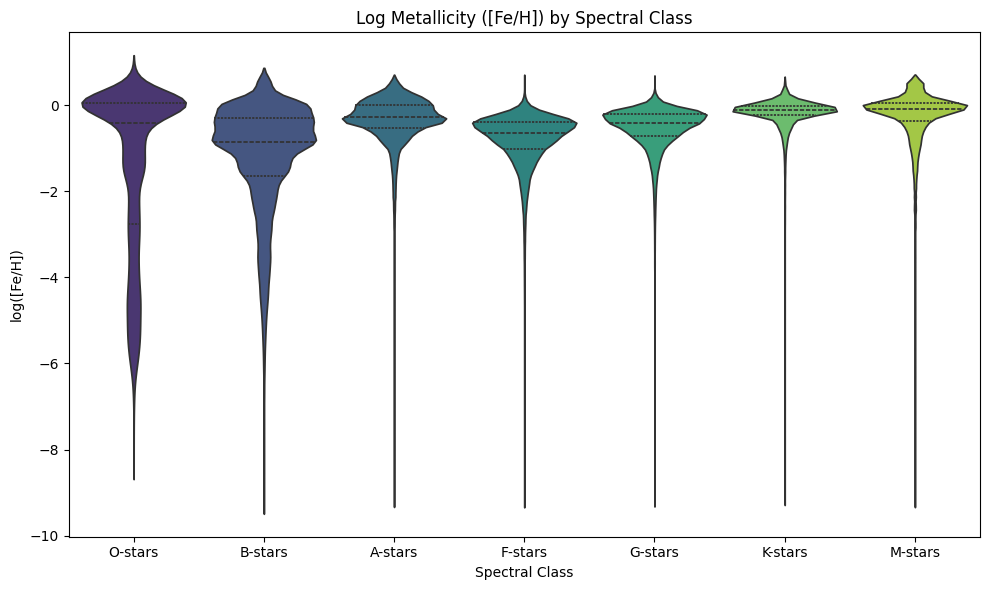

In [29]:
np.isinf(combined_data['[Fe/H]']).sum()
combined_data = combined_data[np.isfinite(combined_data['[Fe/H]'])]
plt.figure(figsize=(10, 6))
sns.violinplot(data=combined_data, x='Class', y='[Fe/H]', palette='viridis', inner='quartile')
plt.title("Log Metallicity ([Fe/H]) by Spectral Class")
plt.xlabel("Spectral Class")
plt.ylabel("log([Fe/H])")
plt.tight_layout()
plt.show()

In [30]:
combined_data.groupby('Class')['[Fe/H]'].describe()

,count,mean,std,min,25%,50%,75%,max
Class,,,,,,,,
A-stars,94304.0,-0.358089,0.610931,-9.210340,-0.530008,-0.281435,0.000300,0.587731
B-stars,69285.0,-1.202830,1.311500,-9.210340,-1.634756,-0.841647,-0.304354,0.587620
F-stars,94988.0,-0.803722,0.653091,-9.210340,-1.016387,-0.635444,-0.394933,0.579194
G-stars,94167.0,-0.541482,0.554390,-9.210340,-0.703703,-0.405565,-0.206717,0.581489
K-stars,99072.0,-0.182681,0.389596,-9.210340,-0.231176,-0.109145,-0.005616,0.587509
M-stars,91062.0,-0.258060,0.627360,-9.210340,-0.368603,-0.097503,0.052972,0.587787
O-stars,14826.0,-1.460872,1.964308,-8.111728,-2.754749,-0.401672,0.055340,0.587287


# Analysis of radius among the spectral types

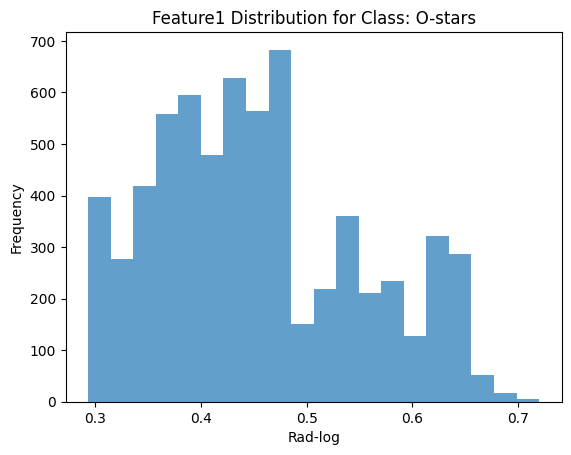

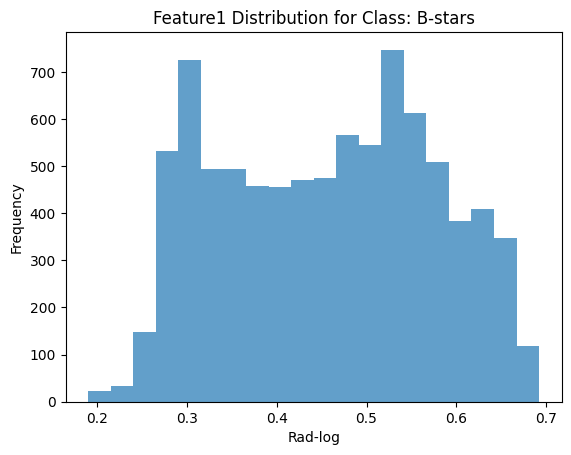

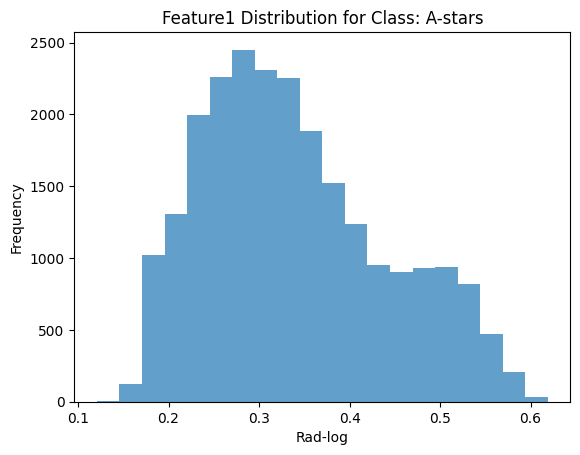

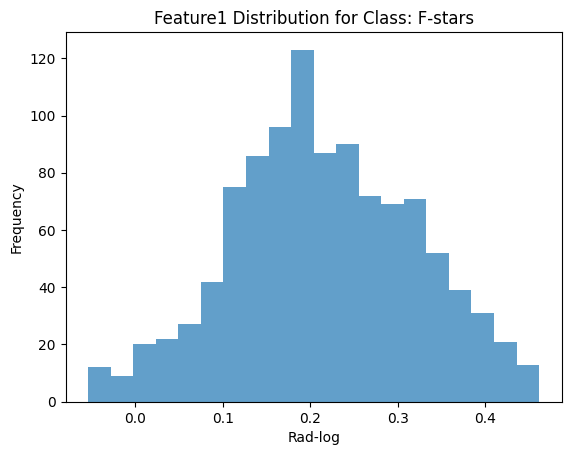

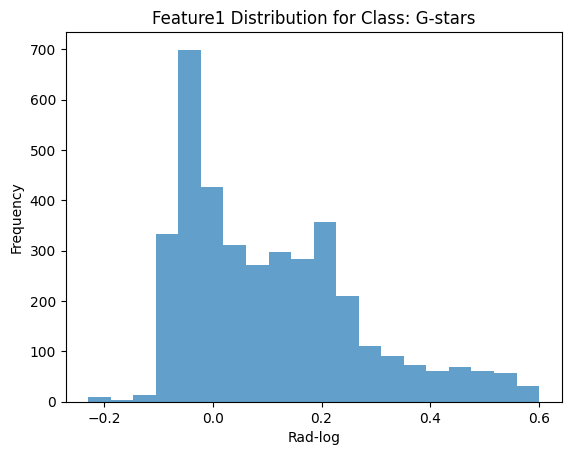

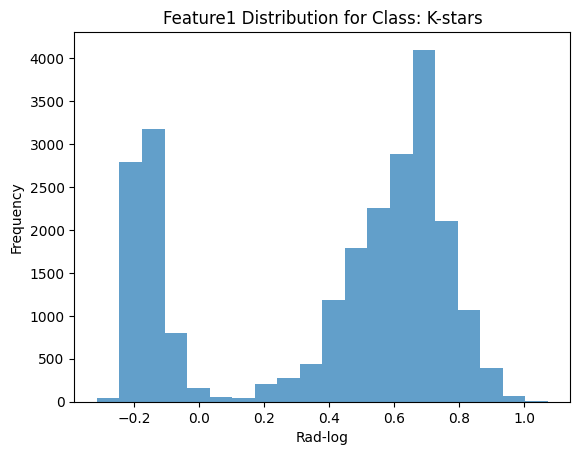

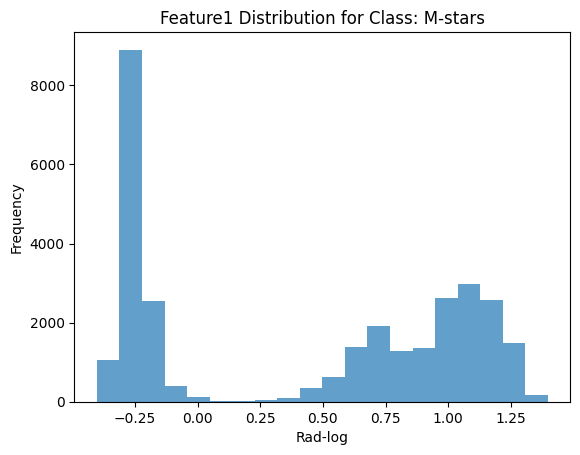

In [31]:
combined_data = combined_data.dropna()
combined_data.isnull().sum()
for cls in unique_classes:
    subset = combined_data[combined_data['Class'] == cls]
    plt.hist(subset['Rad-log'], bins=20, alpha=0.7)
    plt.title(f'Feature1 Distribution for Class: {cls}')
    plt.xlabel('Rad-log')
    plt.ylabel('Frequency')
    plt.show()

# Distance vs Proper Motion

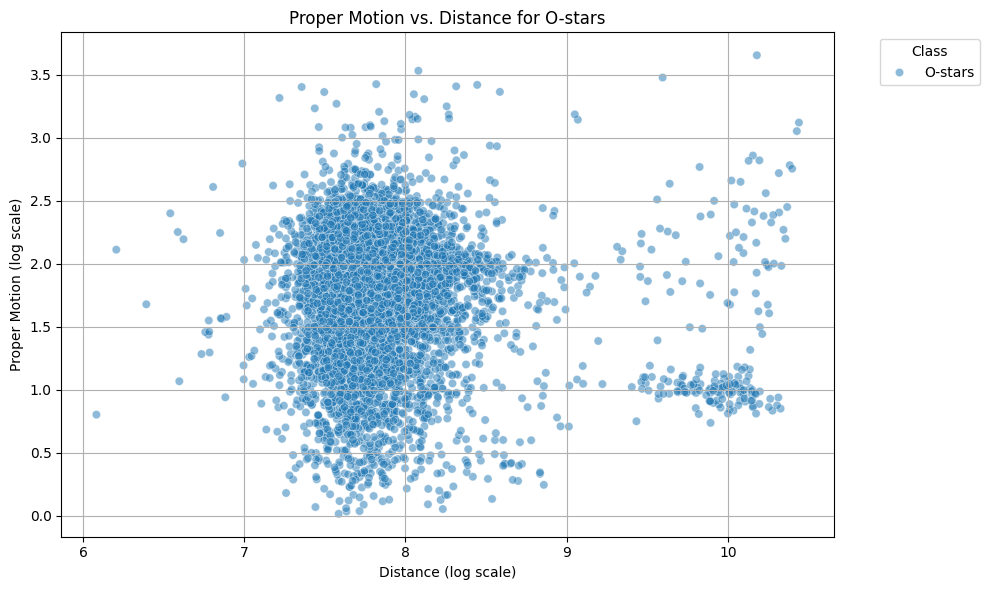

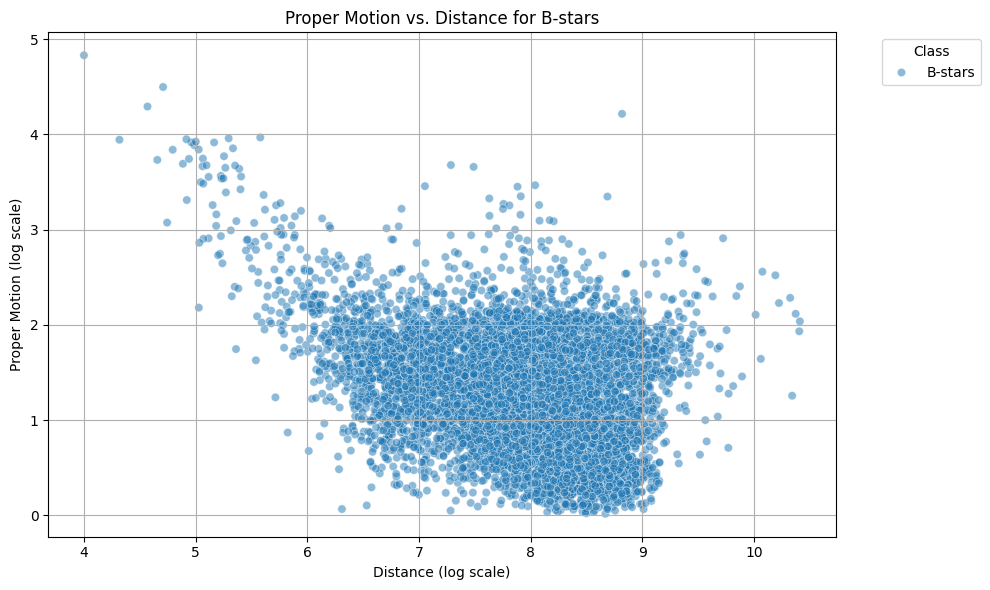

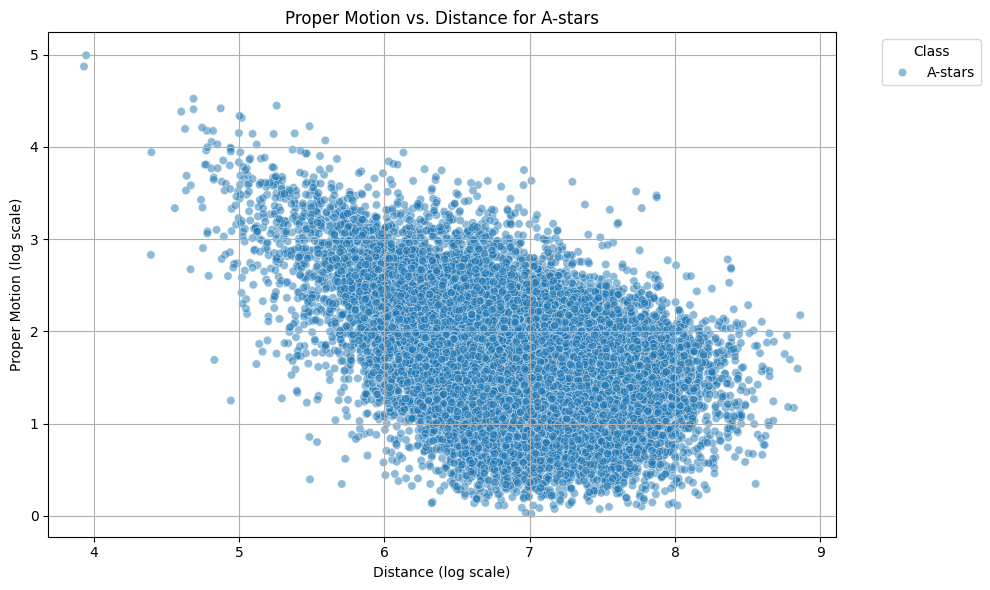

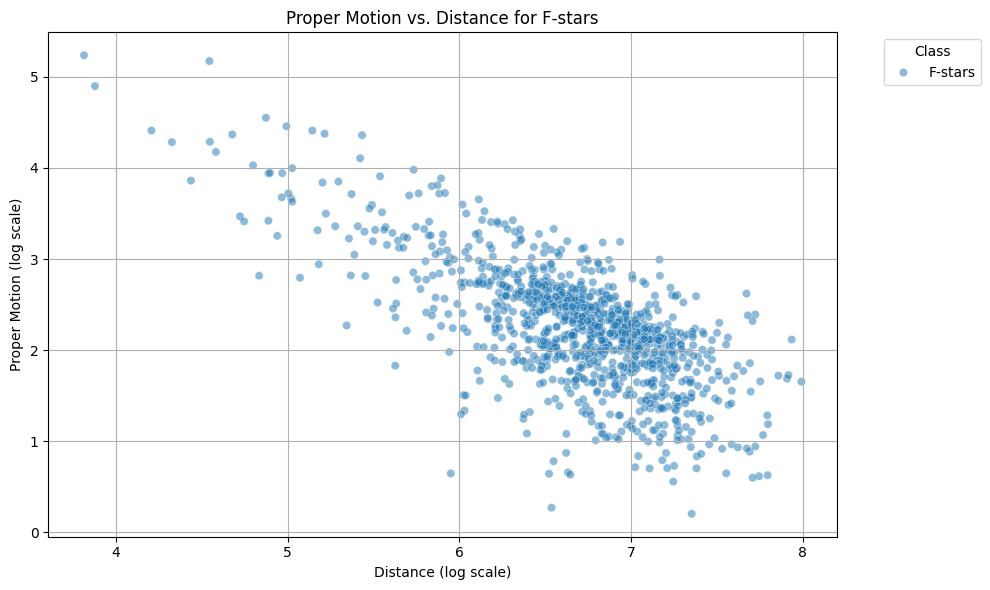

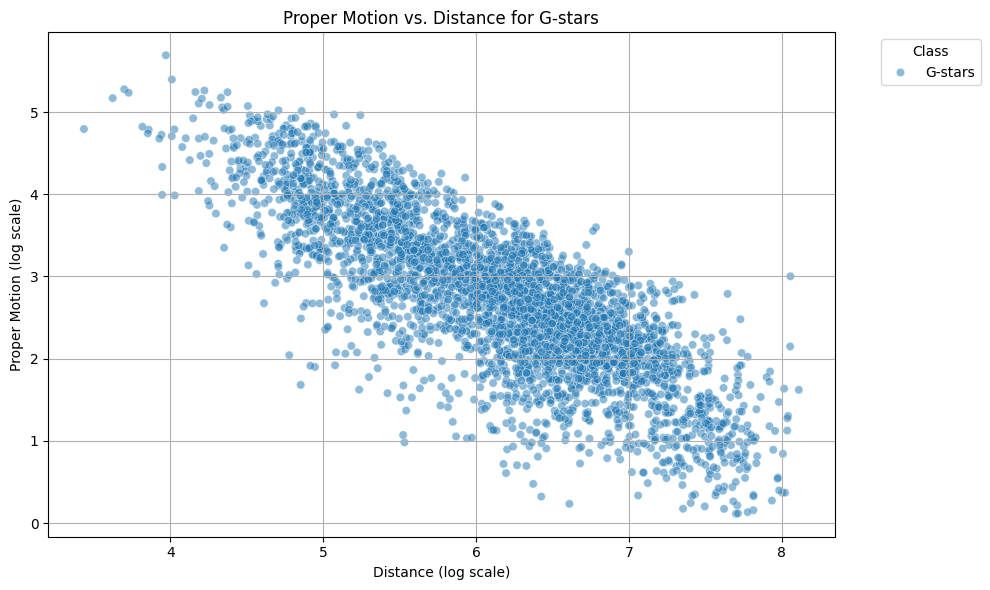

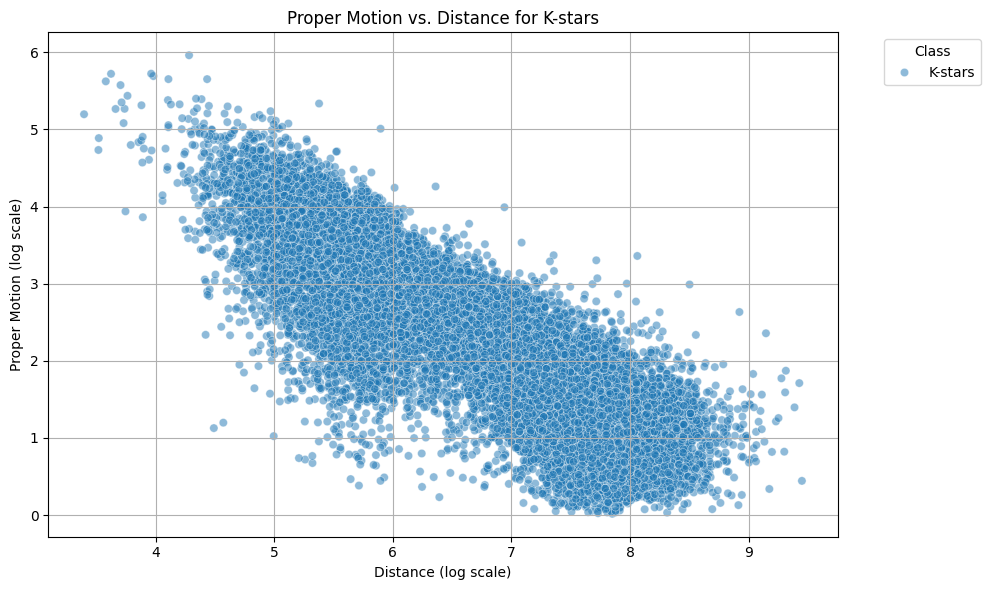

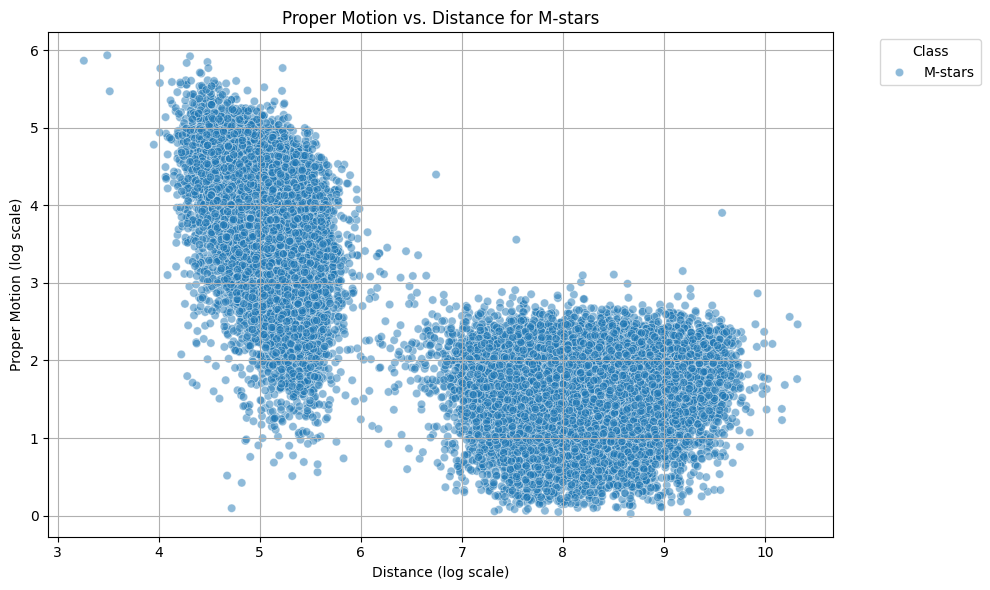

In [32]:
combined_data.groupby('Class')['Dist'].describe()
combined_data.groupby('Class')['PM'].describe()
star_classes = combined_data['Class'].unique()

# Loop through each class and plot
for star_class in star_classes:
    filtered = combined_data[combined_data['Class'] == star_class]

    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=filtered,
        x='Dist',
        y='PM',
        hue='Class',  # will only show one color per class
        palette='tab10',
        alpha=0.5
    )

    plt.xlabel("Distance (log scale)")
    plt.ylabel("Proper Motion (log scale)")
    plt.title(f"Proper Motion vs. Distance for {star_class}")
    plt.legend(title='Class', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# Distance Vs Parallax

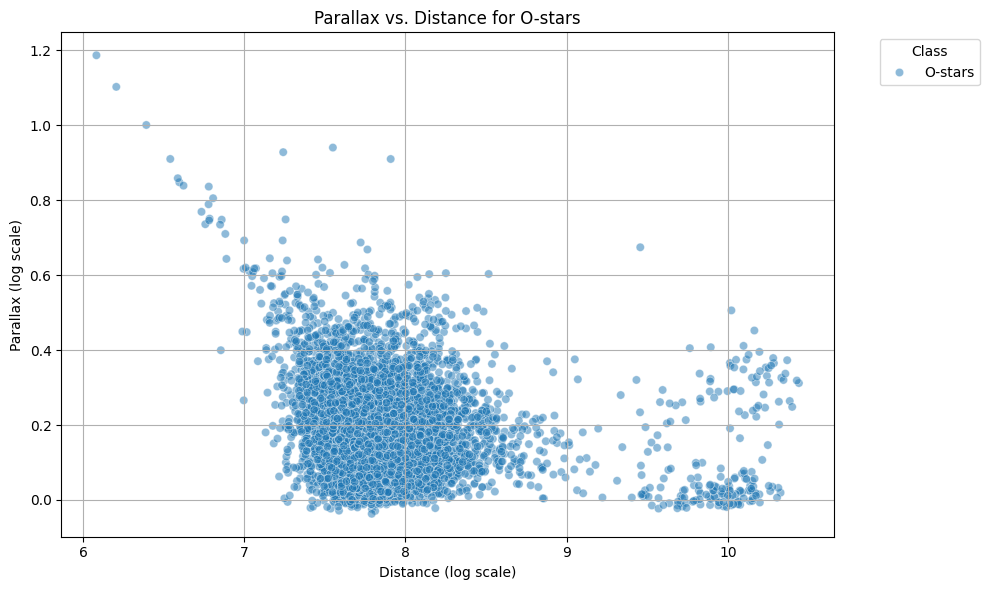

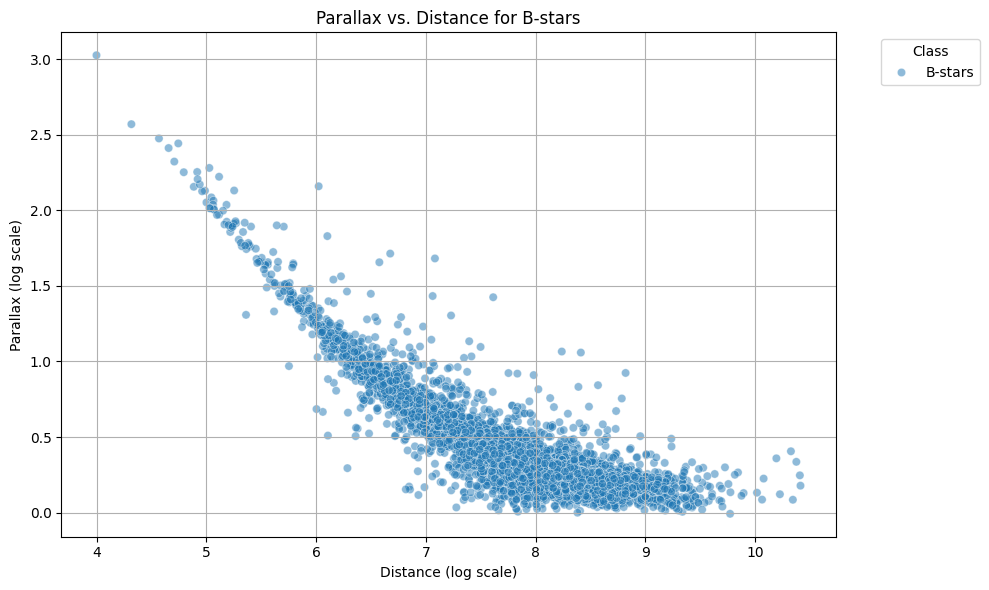

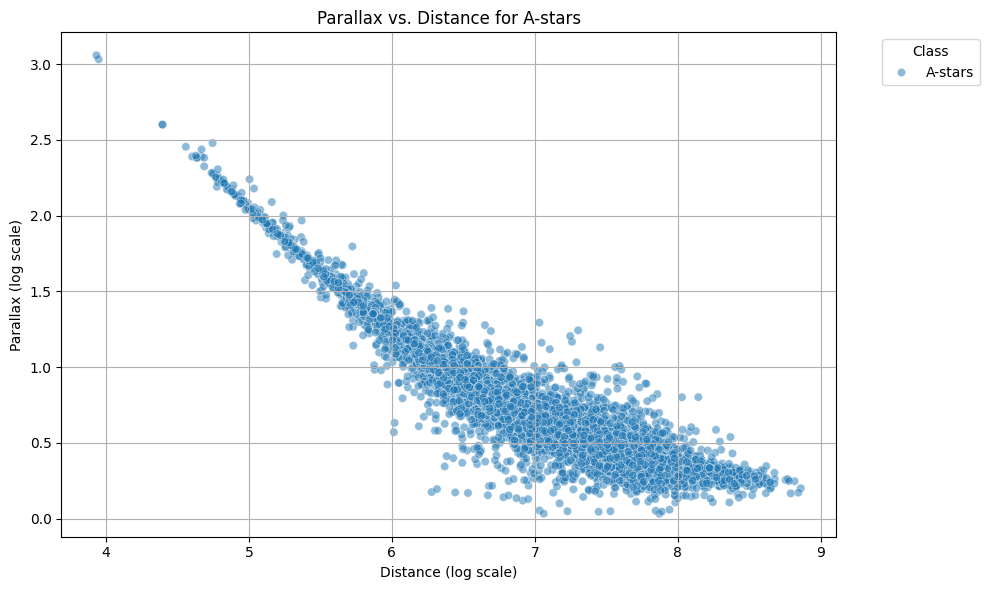

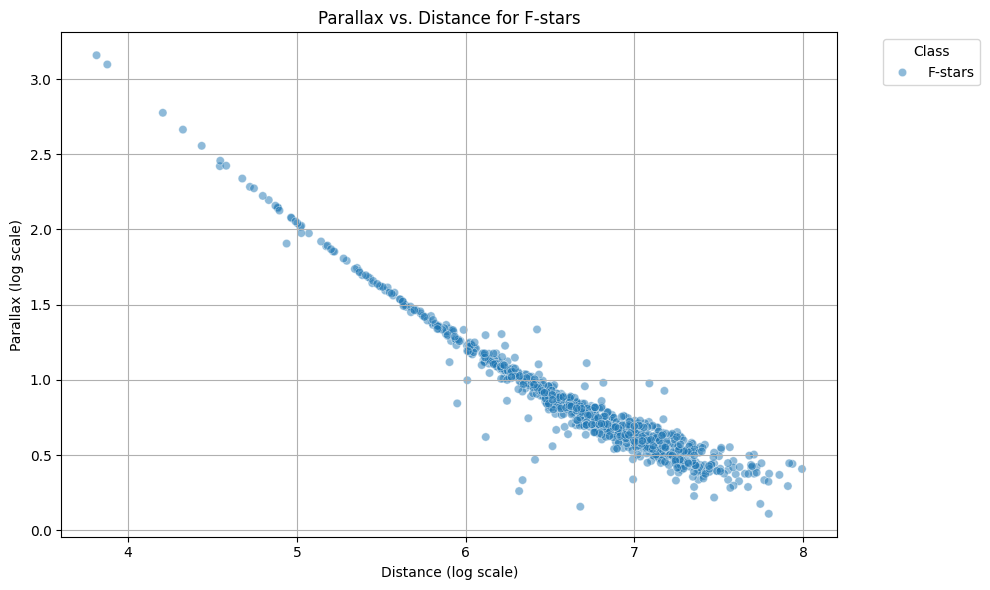

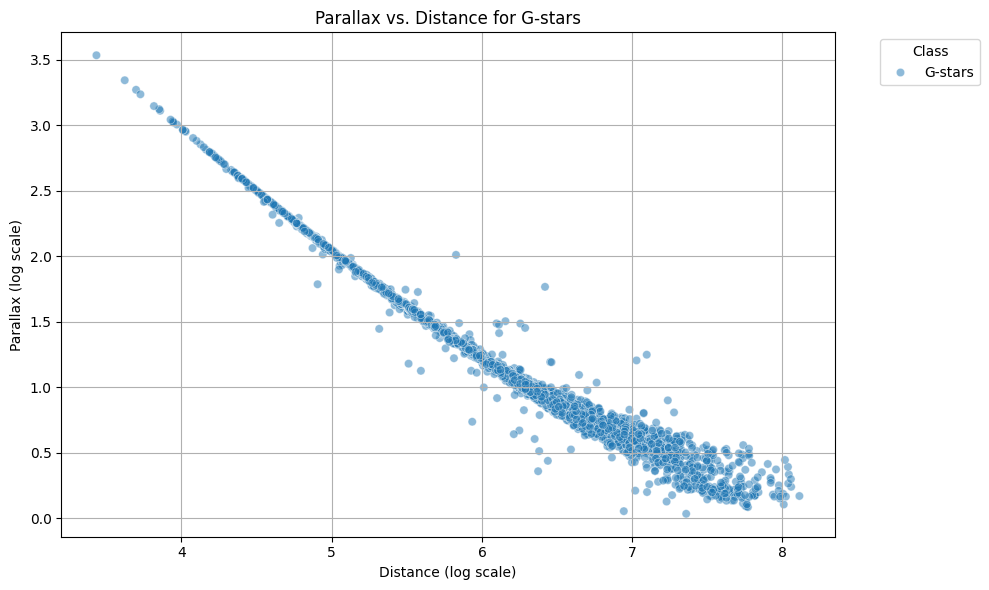

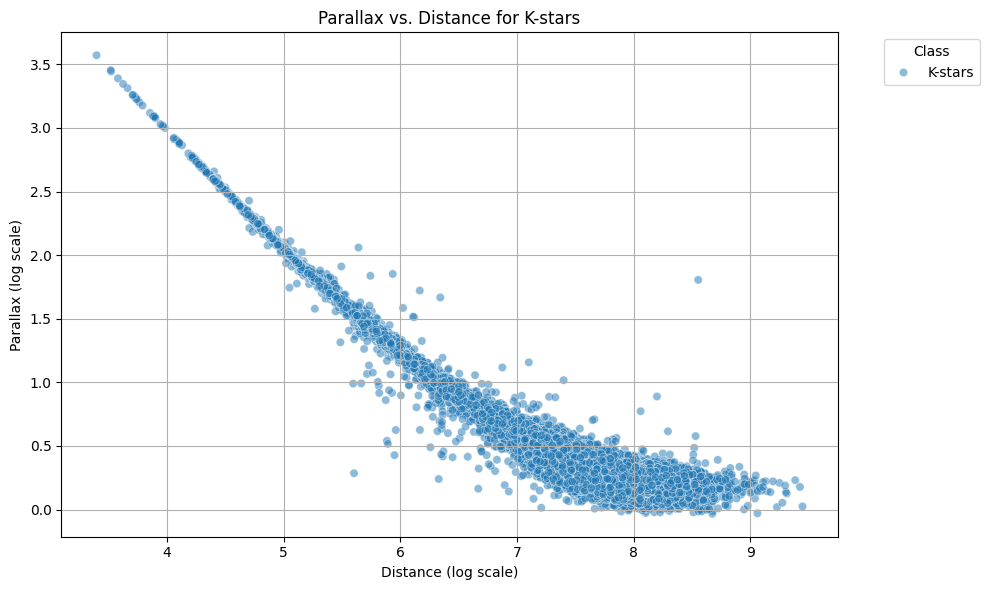

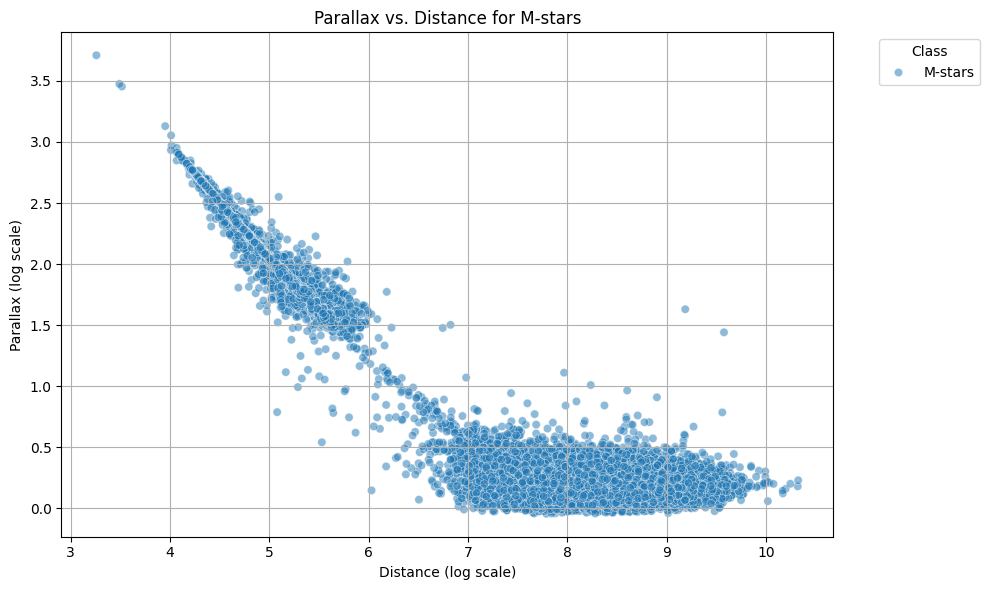

In [33]:
for star_class in star_classes:
    filtered = combined_data[combined_data['Class'] == star_class]

    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=filtered,
        x='Dist',
        y='Plx',
        hue='Class',
        palette='tab10',
        alpha=0.5
    )

    plt.xlabel("Distance (log scale)")
    plt.ylabel("Parallax (log scale)")
    plt.title(f"Parallax vs. Distance for {star_class}")
    plt.legend(title='Class', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Motion-to-Distance Ratio Analysis
To investigate stellar kinematics, we compute a new feature: motion_distance_ratio, defined as the ratio of proper motion (PM) to distance (Dist). This ratio provides insight into how much a star appears to move across the sky relative to how far it is. It can serve as a rough indicator of whether a star is nearby and moving fast or distant and moving slowly.

We use a boxplot to compare this ratio across different spectral types. The plot reveals that M-type stars tend to have higher median and variability in their motion-to-distance ratios, suggesting they are generally closer and show higher apparent motion. In contrast, O- and B-type stars show lower values, consistent with their massive, luminous, and distant nature

<Axes: xlabel='Class', ylabel='motion_distance_ratio'>

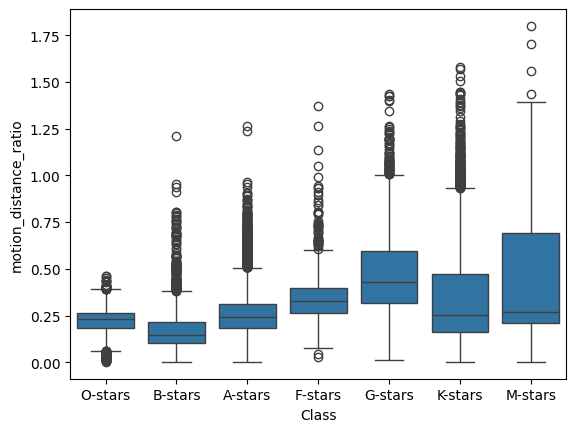

In [34]:
combined_data['motion_distance_ratio'] = combined_data['PM'] / combined_data['Dist']
sns.boxplot(data=combined_data, x='Class', y='motion_distance_ratio')

# Loading cleaned data for modeling

In [35]:

drive.mount('/content/drive',force_remount=True)
path = '/content/drive/MyDrive/'
final= pd.read_csv(f"{path}/model_data.csv")


Mounted at /content/drive


# **Modelling and Analysis**

# Modeling and Feature Preparation
We prepare the dataset for modeling by separating features (X) and labels (y). Here, X includes all numerical columns relevant to stellar properties, while y contains the star's spectral class. The column PWD is dropped as it may contain probability-related redundancy. We also check for missing values and ensure the dataset is clean before modeling.



This cell prints:

The total number of samples (rows) and features (columns),

A list of all feature names,

A preview of the first few rows of the dataset,

Basic statistics like mean, standard deviation, min, and max for each feature.

This provides a good sanity check before modeling.

In [36]:
X = final.drop(columns=['Class'])
y = final['Class']
df = X.copy()
df['target'] = y
print("Dataset information:")
print(f"Number of samples: {X.shape[0]}")
print(f"Number of features: {X.shape[1]}")

print("\nFeature names:")
print(list(X.columns))

print("\nDataset preview:")
print(df.head())

print("\nBasic statistics:")
print(df.describe())


Dataset information:
Number of samples: 557704
Number of features: 22

Feature names:
['Lum-Flame', 'Lum-Flame-Log', 'Teff', 'Rad', 'Rad-log', 'Teff_log', 'Gmag', 'BPmag', 'RPmag', 'GMAG', 'E(BP-RP)', 'logg', '[Fe/H]', 'Plx', 'PM', 'Dist', 'ABP', 'ARP', 'BP-RP', 'BP-RP0', 'ABP - ARP', 'motion_distance_ratio']

Dataset preview:
    Lum-Flame  Lum-Flame-Log      Teff     Rad   Rad-log  Teff_log       Gmag  \
0  298.485140       2.474926  9.806404  1.6635  0.202506  4.262418  16.908537   
1  506.732800       2.704781  9.891535  1.8439  0.238108  4.299101  16.407494   
2    9.055018       0.956989  9.877544  1.8604  0.241131  4.293071  15.607131   
3  311.502840       2.493465  9.823055  1.6652  0.202866  4.269591  16.372738   
4   99.539770       1.998006  9.641341  1.3706  0.131983  4.191366  17.250364   

       BPmag      RPmag    GMAG  ...       Plx        PM      Dist       ABP  \
0  16.761435  17.134040  0.3894  ...  0.213820  1.361233  9.896903  0.008762   
1  16.382404  16.429598 

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.feature_selection import VarianceThreshold

features = final.drop(columns=['Class'])
# Set variance threshold (adjust as needed)
var_threshold = 0.01
selector = VarianceThreshold(threshold=var_threshold)

# Fit the selector to identify low-variance features
selector.fit(features)

# Identify removed features
removed_features = features.columns[~selector.get_support()]
remaining_features = features.columns[selector.get_support()]

# Print details
print(f"Initial number of features: {features.shape[1]}")
print(f"Removing {len(removed_features)} low-variance features (Variance < {var_threshold}):")
print(removed_features.tolist())  # Show feature names that are being removed
print(f"]Remaining features: {len(remaining_features)}")

# Create new DataFrame with selected features
df = pd.DataFrame(selector.transform(features), columns=remaining_features)

# Display dataset after pruning
df.head()

Initial number of features: 22
Removing 0 low-variance features (Variance < 0.01):
[]
]Remaining features: 22


,Lum-Flame,Lum-Flame-Log,Teff,Rad,Rad-log,Teff_log,Gmag,BPmag,RPmag,GMAG,...,[Fe/H],Plx,PM,Dist,ABP,ARP,BP-RP,BP-RP0,ABP - ARP,motion_distance_ratio
0,298.485140,2.474926,9.806404,1.6635,0.202506,4.262418,16.908537,16.761435,17.134040,0.3894,...,-3.725543,0.213820,1.361233,9.896903,0.008762,0.004689,-0.466179,-0.376705,0.004092,0.137541
1,506.732800,2.704781,9.891535,1.8439,0.238108,4.299101,16.407494,16.382404,16.429598,0.0162,...,-4.815891,0.303359,1.424072,9.612094,0.459322,0.272619,-0.048344,-0.316794,0.238702,0.148154
2,9.055018,0.956989,9.877544,1.8604,0.241131,4.293071,15.607131,15.497600,15.672352,0.0268,...,-2.800165,0.467626,1.320422,9.361028,0.240433,0.136016,-0.192071,-0.300752,0.118760,0.141055
3,311.502840,2.493465,9.823055,1.6652,0.202866,4.269591,16.372738,16.354900,16.384790,0.3626,...,-5.654992,0.372046,1.777999,9.430282,0.473871,0.282695,-0.030346,-0.309490,0.246469,0.188541
4,99.539770,1.998006,9.641341,1.3706,0.131983,4.191366,17.250364,17.321453,17.075243,1.1063,...,-4.840893,0.153922,0.899348,9.316472,0.716278,0.450757,0.220107,-0.231090,0.390216,0.096533


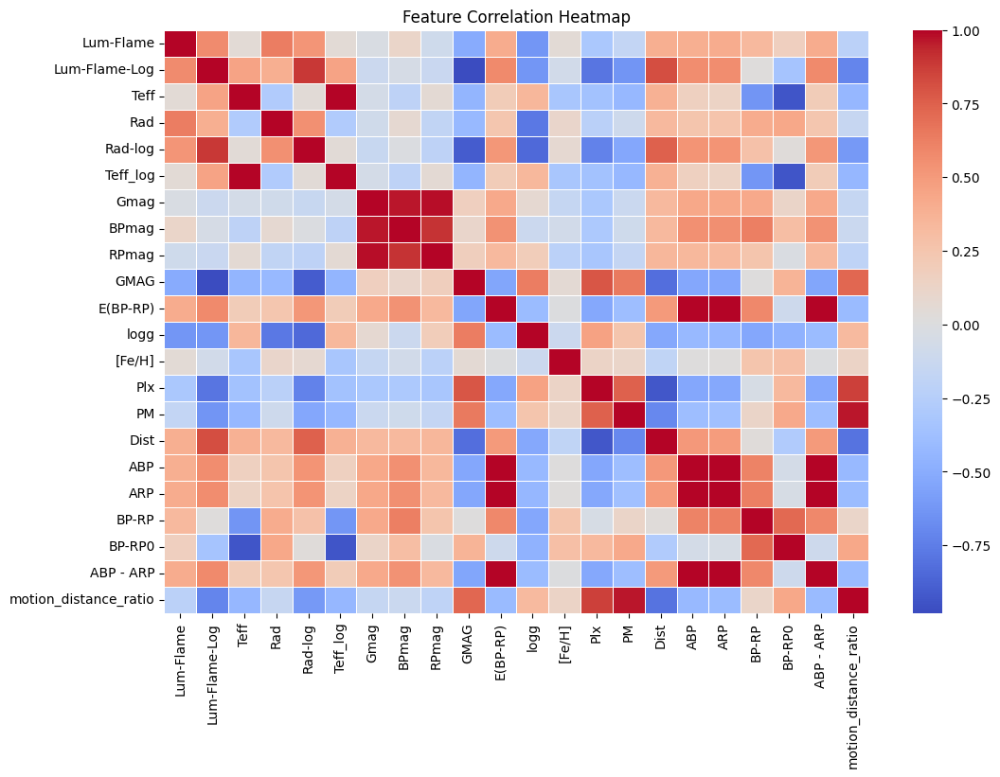

In [38]:
import seaborn as sns
corr_matrix = X.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False, fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

In [39]:
# List of features to drop based on high correlation (|r| > 0.95)
features_to_drop = [
    'Lum-Flame',   # keep Lum-Flame-Log
    'Rad',         # keep Rad-log
    'Teff',        # keep Teff_log
    'ABP',         # keep ABP - ARP
    'ARP',         # keep ABP - ARP
    'BPmag',       # optionally drop one of the magnitudes
    #'Gmag',      # optionally drop if not using for color indices
    'RPmag'      # optionally drop if not using for color indices
]

# Drop the columns
X = X.drop(columns=features_to_drop)



# Optional: confirm what’s left
print("Remaining columns:", X.columns.tolist())


Remaining columns: ['Lum-Flame-Log', 'Rad-log', 'Teff_log', 'Gmag', 'GMAG', 'E(BP-RP)', 'logg', '[Fe/H]', 'Plx', 'PM', 'Dist', 'BP-RP', 'BP-RP0', 'ABP - ARP', 'motion_distance_ratio']


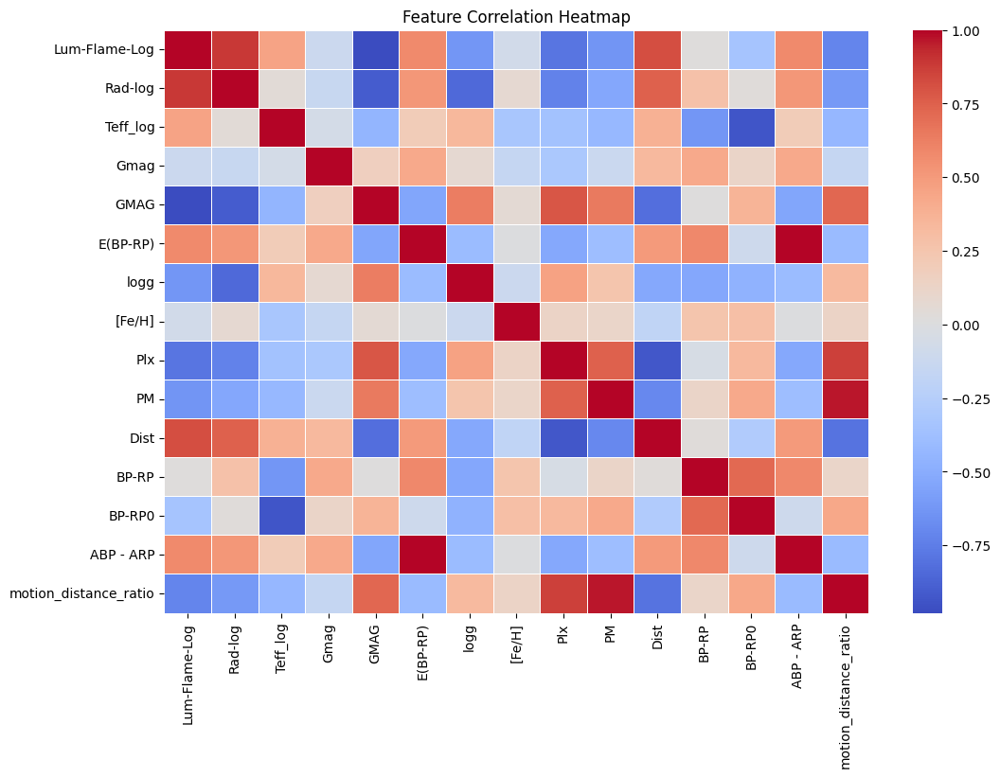

In [40]:
corr_matrix = X.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False, fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

# Feature Scaling
Standardize the features using StandardScaler. This transformation rescales all features to have a mean of 0 and standard deviation of 1. It is essential for many algorithms (like Logistic Regression) to perform optimally.

In [41]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Encode Labels and Split Dataset
We encode the string labels of spectral classes into numeric form using LabelEncoder for compatibility with machine learning models. The data is then split into training and testing sets using an 80/20 split to evaluate performance on unseen data

In [42]:
# 2. Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Scale features

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# **Visualizing true classes with PCA**

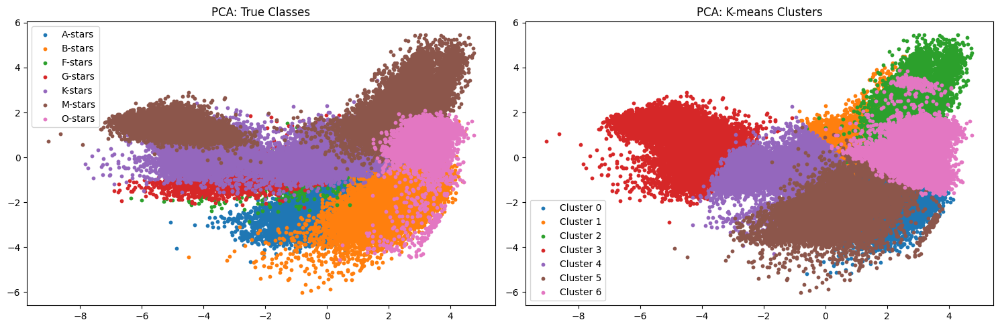

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# === Step 1: Load and split your data ===
# X = your feature matrix
# y = your target labels (e.g., 'A-stars', 'B-stars', etc.)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# === Step 2: Encode target labels ===
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# === Step 3: Scale the features ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Combine all data for visualization ===
X_scaled = np.vstack((X_train_scaled, X_test_scaled))
y_encoded = np.hstack((y_train_encoded, y_test_encoded))

# === Step 5: Apply PCA for dimensionality reduction ===
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# === Step 6: KMeans clustering ===
n_clusters = len(np.unique(y_encoded))  # Auto-detect number of classes
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# === Step 7: Plot true labels and KMeans clusters ===
plt.figure(figsize=(15, 5))

# Plot 1: True Classes
plt.subplot(1, 2, 1)
class_names = label_encoder.classes_
for i in np.unique(y_encoded):
    plt.scatter(X_pca[y_encoded == i, 0], X_pca[y_encoded == i, 1], label=class_names[i], s=10)
plt.title('PCA: True Classes')
plt.legend()

# Plot 2: KMeans Clusters
plt.subplot(1, 2, 2)
for i in range(n_clusters):
    plt.scatter(X_pca[cluster_labels == i, 0], X_pca[cluster_labels == i, 1], label=f'Cluster {i}', s=10)
plt.title('PCA: K-means Clusters')
plt.legend()

plt.tight_layout()
plt.show()


# **Visualizing true classes with UMAP**

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


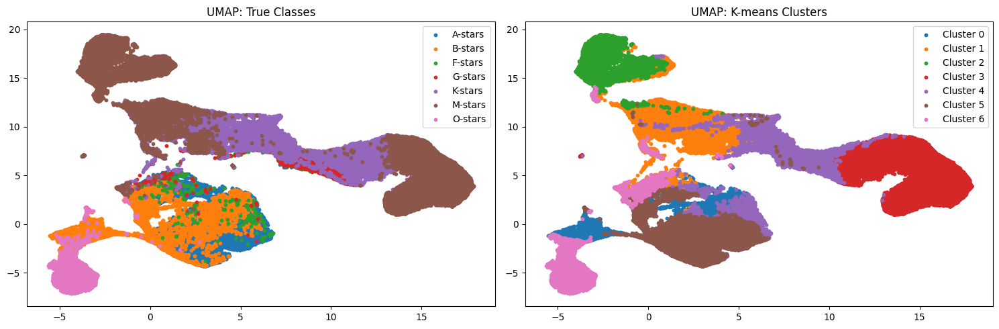

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
import umap  # make sure to install with: pip install umap-learn

# === Step 1: Load and split your data ===
# X = your feature matrix
# y = your target labels (e.g., 'A-stars', 'B-stars', etc.)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# === Step 2: Encode target labels ===
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# === Step 3: Scale the features ===
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Combine for visualization ===
X_scaled = np.vstack((X_train_scaled, X_test_scaled))
y_encoded = np.hstack((y_train_encoded, y_test_encoded))

# === Step 5: UMAP for dimensionality reduction ===
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(X_scaled)

# === Step 6: KMeans clustering ===
n_clusters = len(np.unique(y_encoded))
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# === Step 7: Plot true classes and KMeans clusters ===
plt.figure(figsize=(15, 5))

# Plot 1: True Classes
plt.subplot(1, 2, 1)
class_names = label_encoder.classes_
for i in np.unique(y_encoded):
    plt.scatter(X_umap[y_encoded == i, 0], X_umap[y_encoded == i, 1], label=class_names[i], s=10)
plt.title('UMAP: True Classes')
plt.legend()

# Plot 2: KMeans Clusters
plt.subplot(1, 2, 2)
for i in range(n_clusters):
    plt.scatter(X_umap[cluster_labels == i, 0], X_umap[cluster_labels == i, 1], label=f'Cluster {i}', s=10)
plt.title('UMAP: K-means Clusters')
plt.legend()

plt.tight_layout()
plt.show()


# Base Model with Logistic regression, Random Forest And XG boost
After evaluating multiple models—Logistic Regression, Random Forest, and XGBoost—we compare their performance metrics to identify the best classifier for spectral type prediction.

#- **Logistic Regression** achieved an accuracy of **87.6%** with strong performance on A-, B-, K-, M-, and O-stars but showed slightly lower precision for G- and F-stars.
 - **Random Forest** delivered the best performance with an accuracy of **89.8%** and F1-score of **89.9%**, demonstrating excellent classification across all spectral types, especially O- and B-stars.
 - **XGBoost** closely followed with an accuracy of **89.6%** and F1-score of **89.6%**, but produced more warnings due to deprecated parameters.

 **Conclusion**: Based on accuracy, F1-score, and balanced class performance, **Random Forest and XG BOost both** are  the best model for this stellar classification task.
#

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, f1_score, classification_report, mean_squared_error, r2_score
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Define models
models = {
    'Logistic Regression': LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=200, random_state=42),
    'XGBoost': XGBClassifier(
        n_estimators=200,
        learning_rate=0.1,
        objective='multi:softmax',
        use_label_encoder=False,
        eval_metric='mlogloss',
        random_state=42
    )
}

# Evaluate models
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    model.fit(X_train_scaled, y_train_encoded)

    # Predict (numerical)
    y_pred_encoded = model.predict(X_test_scaled)

    # Decode predictions back to original class labels
    y_pred_labels = label_encoder.inverse_transform(y_pred_encoded)


    r2 = r2_score(y_test_encoded, y_pred_encoded)
    accuracy = accuracy_score(y_test_encoded, y_pred_encoded)
    f1 = f1_score(y_test_encoded, y_pred_encoded, average='weighted')
    cv_scores = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='accuracy')

    cv_accuracy = cv_scores.mean()

    results[name] = {
        'model': model,
        'Accuracy': accuracy,
        'F1 Score': f1,
        'Predictions': y_pred_labels

    }
    print(f"CV Accuracy  : {cv_accuracy:.4f}")

    print(f"{name} - Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}")
    print(f"  Classification Report for {name}:\n")
    print(classification_report(y_test, y_pred_labels))

    # Find best model
best_model_name = max(results, key=lambda x: results[x]['Accuracy'])
best_model = results[best_model_name]['model']
print(f"\nBest model: {best_model_name}")



Training Logistic Regression...


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi

CV Accuracy  : 0.8767
Logistic Regression - Accuracy: 0.8762, F1 Score: 0.8769
  Classification Report for Logistic Regression:

              precision    recall  f1-score   support

     A-stars       0.96      0.97      0.96     18666
     B-stars       0.98      0.97      0.97     13946
     F-stars       0.79      0.77      0.78     19111
     G-stars       0.72      0.77      0.74     18905
     K-stars       0.89      0.86      0.88     19842
     M-stars       0.95      0.94      0.94     18129
     O-stars       0.92      0.94      0.93      2942

    accuracy                           0.88    111541
   macro avg       0.89      0.89      0.89    111541
weighted avg       0.88      0.88      0.88    111541


Training Random Forest...


# Confusion Matrix – Evaluating Classification Performance
The confusion matrix below offers a detailed view of how well the selected classifier (Random Forest) performed across each spectral class.

 - **Diagonal values** represent correctly classified instances (true positives).
 - **Off-diagonal values** indicate misclassifications (false positives and false negatives).

 This visualization helps pinpoint which classes the model sometimes confuses. For instance:
 - F-stars and G-stars show moderate confusion with one another, likely due to overlapping feature characteristics.
 - A-stars, B-stars, M-stars, and O-stars are classified with high precision and low misclassification rates.

In [ ]:
class_labels = list(label_encoder.classes_)

# Confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_labels, labels=class_labels)
cm_df = pd.DataFrame(cm, index=class_labels, columns=class_labels)

# Plot
plt.figure(figsize=(10, 8))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.title("Confusion Matrix of Star Classification")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

#Handling Class Imbalance with SMOTE
 Despite strong model performance, certain spectral classes—especially F-stars and G-stars—had lower precision and recall due to imbalanced representation in the dataset.

 To address this, we apply **SMOTE (Synthetic Minority Oversampling Technique)** to boost the number of training samples in the minority classes:
 - Add 50,000 synthetic samples to **F-stars** and **G-stars**.
 - Match **O-stars** sample size to that of **B-stars** for better class parity.

 This technique helps the model learn better decision boundaries for underrepresented classes.

 The class distribution is printed before and after SMOTE to confirm resampling effectiveness

In [ ]:
from collections import Counter
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE


expected_classes = ['A-stars', 'B-stars', 'F-stars', 'G-stars', 'K-stars', 'M-stars', 'O-stars']
label_encoder = LabelEncoder()
label_encoder.fit(expected_classes)
y_train_int = label_encoder.transform(y_train)

class_counts = Counter(y_train_int)
print("\n🔵 Original Class Distribution:")
for label_int, count in class_counts.items():
    label_name = label_encoder.inverse_transform([label_int])[0]
    print(f"{label_name}: {count}")


f_index = label_encoder.transform(['F-stars'])[0]
g_index = label_encoder.transform(['G-stars'])[0]
o_index = label_encoder.transform(['O-stars'])[0]
b_index = label_encoder.transform(['B-stars'])[0]


sampling_strategy = {
    f_index: class_counts[f_index] + 50000,   # Boost F-stars
    g_index: class_counts[g_index] + 50000,   # Boost G-stars
    o_index: class_counts[b_index]            # Match O-stars to B-stars
}


smote = SMOTE(sampling_strategy=sampling_strategy, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train_int)


print("\n🟢 Class Distribution After SMOTE:")
for label_int, count in Counter(y_train_resampled).items():
    label_name = label_encoder.inverse_transform([label_int])[0]
    print(f"{label_name}: {count}")



🔵 Original Class Distribution:
F-stars: 75990
K-stars: 79257
B-stars: 55428
M-stars: 72850
A-stars: 75443
G-stars: 75334
O-stars: 11861

🟢 Class Distribution After SMOTE:
F-stars: 125990
K-stars: 79257
B-stars: 55428
M-stars: 72850
A-stars: 75443
G-stars: 125334
O-stars: 55428


# 39. Retraining XGBoost on Resampled Data
 After applying SMOTE to rebalance the dataset, we retrain an **XGBoost classifier** using the resampled training data. Key points in this process:

 - **XGBClassifier** is configured with `use_label_encoder=False` and `eval_metric='mlogloss'` to align with updated XGBoost API standards.
 - The model is evaluated using 5-fold cross-validation on the training set and performance is reported on the original test set.


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.model_selection import cross_val_score


model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
model.fit(X_train_resampled, y_train_resampled)


cv_scores = cross_val_score(model, X_train_resampled, y_train_resampled, cv=5, scoring='accuracy')
cv_accuracy = cv_scores.mean()

y_pred = model.predict(X_test_scaled)


y_pred_labels = label_encoder.inverse_transform(y_pred)
y_test_labels = y_test


accuracy = accuracy_score(y_test_labels, y_pred_labels)
f1 = f1_score(y_test_labels, y_pred_labels, average='weighted')
report = classification_report(y_test_labels, y_pred_labels)


print(f"\n XGBoost Accuracy on Test Set     : {accuracy:.4f}")
print(f" Cross-Validation Accuracy (5-fold): {cv_accuracy:.4f}")
print(f" Weighted F1 Score                : {f1:.4f}")
print("\n Classification Report:\n")
print(report)


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [13:49:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [13:49:58] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [13:50:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [13:50:14] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [13:50:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e


📈 XGBoost Accuracy on Test Set     : 0.8975
📘 Cross-Validation Accuracy (5-fold): 0.8913
📊 Weighted F1 Score                : 0.8984

📋 Classification Report:

              precision    recall  f1-score   support

     A-stars       0.98      0.97      0.98     18861
     B-stars       0.99      0.98      0.98     13857
     F-stars       0.81      0.81      0.81     18998
     G-stars       0.74      0.78      0.76     18833
     K-stars       0.93      0.89      0.91     19815
     M-stars       0.98      0.97      0.97     18212
     O-stars       0.92      0.99      0.95      2965

    accuracy                           0.90    111541
   macro avg       0.91      0.91      0.91    111541
weighted avg       0.90      0.90      0.90    111541



# **XGBoost with Grid Search and Class Weighting**

In [ ]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

from xgboost import XGBClassifier

# ====== 1. Encode target labels ======
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# ====== 2. Handle class imbalance ======
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train_encoded)

# ====== 3. Setup XGBoost Classifier ======
model = XGBClassifier(
    objective='multi:softmax',
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=42
)

# ====== 4. Define parameter grid ======
param_grid = {
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1]
}

# ====== 5. Setup GridSearchCV ======
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='f1_weighted',
    cv=5,
    verbose=2,
    n_jobs=-1
)

# ====== 6. Fit the model ======
grid_search.fit(X_train_scaled, y_train_encoded, sample_weight=sample_weights)

# ====== 7. Predict and Evaluate ======
best_model = grid_search.best_estimator_
print("\nBest Parameters:", grid_search.best_params_)

# Predict
y_pred_encoded = best_model.predict(X_test_scaled)
y_pred_labels = label_encoder.inverse_transform(y_pred_encoded)

# Scores
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)
f1 = f1_score(y_test_encoded, y_pred_encoded, average='weighted')
cv_scores = cross_val_score(best_model, X_train_scaled, y_train_encoded, cv=5, scoring='accuracy')
cv_accuracy = cv_scores.mean()

# Classification Report
report = classification_report(y_test_encoded, y_pred_encoded, target_names=label_encoder.classes_)


print(f"\n XGBoost Accuracy on Test Set     : {accuracy:.4f}")
print(f" Cross-Validation Accuracy (5-fold): {cv_accuracy:.4f}")
print(f" Weighted F1 Score                : {f1:.4f}")
print("\n Classification Report:\n")
print(report)



Fitting 5 folds for each of 27 candidates, totalling 135 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:17:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300}


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:17:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:17:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:17:58] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:18:03] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:18:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e


 XGBoost Accuracy on Test Set     : 0.9580
 Cross-Validation Accuracy (5-fold): 0.9602
 Weighted F1 Score                : 0.9585

 Classification Report:

              precision    recall  f1-score   support

     A-stars       0.99      0.98      0.99      4755
     B-stars       0.97      0.98      0.97      1732
     F-stars       0.59      0.61      0.60       221
     G-stars       0.75      0.84      0.79       777
     K-stars       0.94      0.95      0.95      4772
     M-stars       0.98      0.96      0.97      5933
     O-stars       0.99      0.98      0.99      1279

    accuracy                           0.96     19469
   macro avg       0.89      0.90      0.89     19469
weighted avg       0.96      0.96      0.96     19469



Random Forest with Specific Sampling Criteria (Split=5, Leaf=5)
 As a final configuration, we train a **Random Forest model** with the following settings:
#
 - `n_estimators = 200`
 - `max_depth = 20`
 - `min_samples_split = 5`
 - `min_samples_leaf = 5`


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


model = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    min_samples_split=5,
    min_samples_leaf=5,
    random_state=42
)


model.fit(X_train_scaled, y_train_encoded)


y_pred = model.predict(X_test_scaled)

y_pred_labels = label_encoder.inverse_transform(y_pred)
y_test_labels = label_encoder.inverse_transform(y_test_encoded)


mse = mean_squared_error(y_test_encoded, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_encoded, y_pred)
accuracy = accuracy_score(y_test_encoded, y_pred)
f1 = f1_score(y_test_encoded, y_pred, average='weighted')
cv_scores = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='accuracy')
cv_accuracy = cv_scores.mean()


name = 'Random Forest with 5 samples split and 5 samples leaf'
results = {}
results[name] = {
    'Accuracy': accuracy,
    'F1 Score': f1,
    'RMSE': rmse,
    'R²': r2,
    'Predictions': y_pred_labels
}

print(f"\n CV Accuracy     : {cv_accuracy:.4f}")
print(f" Accuracy        : {accuracy:.4f}")
print(f" F1 Score        : {f1:.4f}")
print(f" RMSE            : {rmse:.4f}")
print(f" R² Score        : {r2:.4f}")
print(f"\n Classification Report for {name}:\n")
print(classification_report(y_test_labels, y_pred_labels))


📊 CV Accuracy     : 0.8964
✅ Accuracy        : 0.8978
✅ F1 Score        : 0.8980
📉 RMSE            : 0.4292
📈 R² Score        : 0.9414

🔍 Classification Report for Random Forest with 5 samples split and 5 samples leaf:

              precision    recall  f1-score   support

     A-stars       0.97      0.97      0.97     18861
     B-stars       0.99      0.98      0.98     13857
     F-stars       0.81      0.80      0.81     18998
     G-stars       0.75      0.76      0.76     18833
     K-stars       0.91      0.91      0.91     19815
     M-stars       0.98      0.97      0.97     18212
     O-stars       0.94      0.98      0.96      2965

    accuracy                           0.90    111541
   macro avg       0.91      0.91      0.91    111541
weighted avg       0.90      0.90      0.90    111541



# XGboost with class weights

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier


label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)


sample_weights = compute_sample_weight(class_weight='balanced', y=y_train_encoded)


model = XGBClassifier(
    n_estimators=300, learning_rate=0.1,
    objective='multi:softmax',
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=42
)

model.fit(X_train_scaled, y_train_encoded, sample_weight=sample_weights)


y_pred_encoded = model.predict(X_test_scaled)


y_pred_labels = label_encoder.inverse_transform(y_pred_encoded)


accuracy = accuracy_score(y_test, y_pred_labels)
f1 = f1_score(y_test, y_pred_labels, average='weighted')
cv_scores = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='accuracy')
cv_accuracy = cv_scores.mean()


report = classification_report(y_test, y_pred_labels, target_names=label_encoder.classes_)

print(f"\n XGBoost Evaluation with Class Weighting:")
print(f"Accuracy     : {accuracy:.4f}")
print(f"F1 Score     : {f1:.4f}")
print(f"CV Accuracy  : {cv_accuracy:.4f}")
print("\nClassification Report:\n", report)





/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:10:14] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:10:39] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:10:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:11:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e


📊 XGBoost Evaluation with Class Weighting:
Accuracy     : 0.8974
F1 Score     : 0.8977
CV Accuracy  : 0.8966

Classification Report:
               precision    recall  f1-score   support

     A-stars       0.97      0.98      0.97     18666
     B-stars       0.99      0.98      0.99     13946
     F-stars       0.81      0.80      0.80     19111
     G-stars       0.74      0.77      0.76     18905
     K-stars       0.92      0.91      0.91     19842
     M-stars       0.98      0.97      0.97     18129
     O-stars       0.94      0.99      0.96      2942

    accuracy                           0.90    111541
   macro avg       0.91      0.91      0.91    111541
weighted avg       0.90      0.90      0.90    111541



## Feature importance


<ipython-input-46-892c92fd586c>:19: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


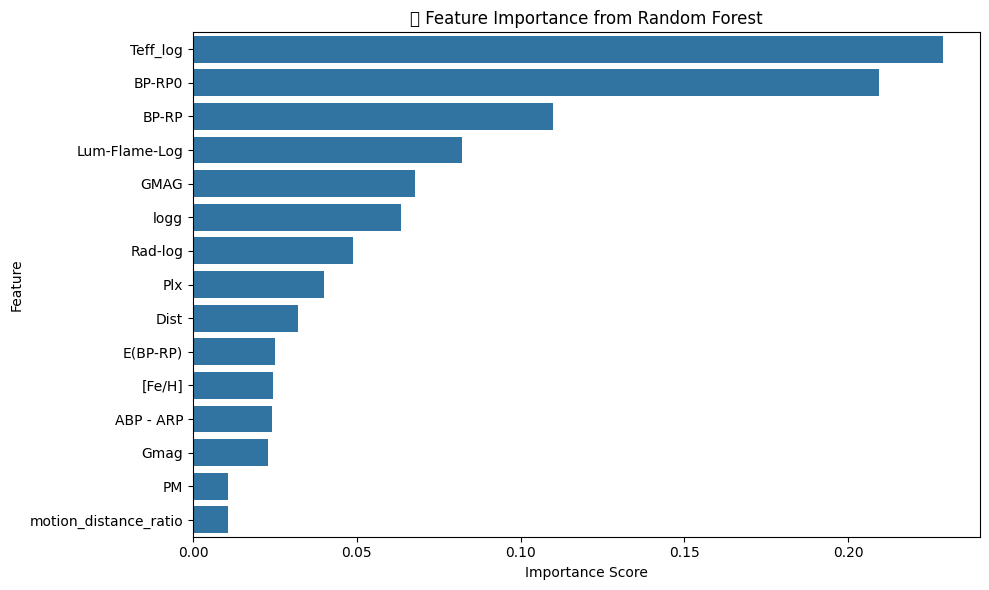

In [ ]:

importances = model.feature_importances_

feature_names = X_test.columns


feat_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feat_imp_df)
plt.title(' Feature Importance from Random Forest')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

# **Correct vs Incorrect Predictions for F & G Stars**
To further analyze the model’s weaknesses, we inspect how well the model distinguishes between **F-stars** and **G-stars**, which often show confusion.

 - First, we add a `True` and `Pred` label to the test set.
 - Then, we create a `Correct` column to indicate whether the prediction matches the true label.

 We specifically isolate rows where both true and predicted classes are either **F-stars** or **G-stars**. Then, we analyze how many predictions were correct vs. incorrect.

 Finally, we use **Seaborn's KDE plots** to visualize the distribution of several stellar features like:
 - `Teff_log` (log Temperature), `BP-RP0` (corrected color index), `Lum-Flame-Log` (log Luminosity), `logg` (surface gravity), `Rad-log` (log radius), and `GMAG` (absolute magnitude).

# These plots are split by `Correct=True` vs `Correct=False` to help visually understand where the model struggles most in distinguishing F- and G-type stars.

In [ ]:
df = X_test.copy()

df['True'] = y_test
df['Pred'] = y_pred
df['Correct'] = df['True'] == df['Pred']

In [ ]:
print(df['True'].value_counts())

True
K-stars    19815
F-stars    18998
A-stars    18861
G-stars    18833
M-stars    18212
B-stars    13857
O-stars     2965
Name: count, dtype: int64


In [ ]:
df['Pred'] = label_encoder.inverse_transform(y_pred)
print(df['Pred'].value_counts())

Pred
K-stars    19691
G-stars    19201
A-stars    18885
F-stars    18853
M-stars    18006
B-stars    13803
O-stars     3102
Name: count, dtype: int64


In [ ]:
df['Correct'] = df['True'] == df['Pred']


In [ ]:
df_fg = df[
    (df['True'].isin(['F-stars', 'G-stars'])) &
    (df['Pred'].isin(['F-stars', 'G-stars']))
]

In [ ]:
print(df_fg['Correct'].value_counts())


Correct
True     29627
False     6608
Name: count, dtype: int64


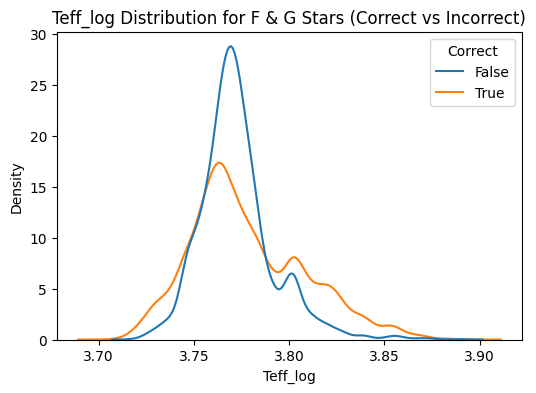

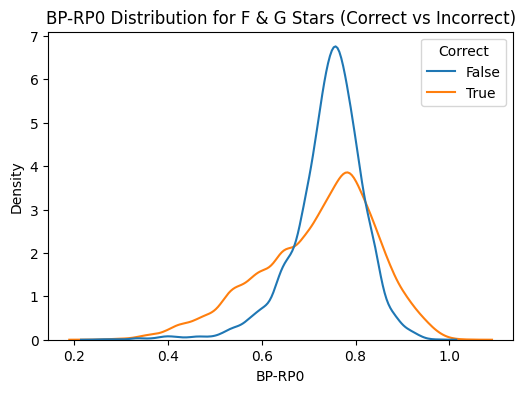

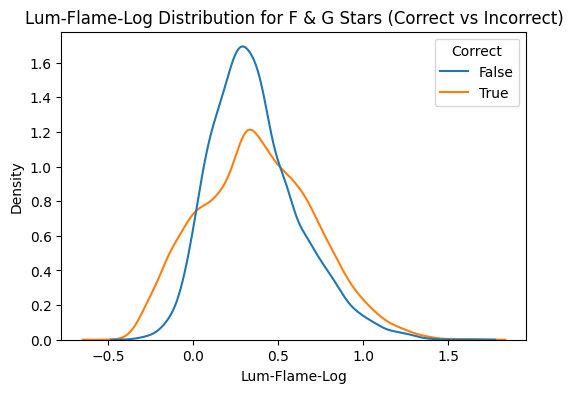

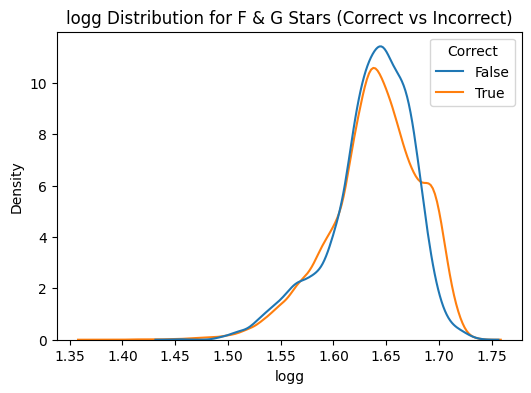

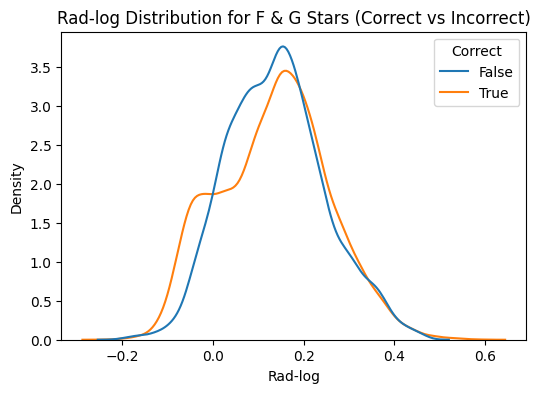

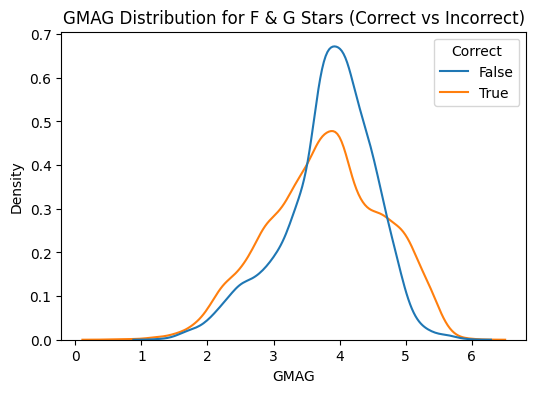

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for feature in ['Teff_log', 'BP-RP0', 'Lum-Flame-Log', 'logg', 'Rad-log', 'GMAG']:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(data=df_fg, x=feature, hue='Correct', common_norm=False)
    plt.title(f"{feature} Distribution for F & G Stars (Correct vs Incorrect)")
    plt.show()

# **Scatterplot Visualization: Teff_log vs BP-RP0:**
 To better visualize model confusion zones between F and G stars, we plot a 2D scatterplot:
 - **X-axis**: `Teff_log` (logarithmic temperature)
 - **Y-axis**: `BP-RP0` (corrected color index)
 - **Hue**: Green for correct predictions, red for incorrect
 - **Style**: Class label shapes to distinguish F- from G-stars

 The clear diagonal line shows the tight correlation between temperature and color. Incorrect predictions (in red) tend to cluster where the two classes overlap in feature space. This visualization helps identify regions where feature separation is insufficient and could benefit from deeper modeling or new features

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127756 (\N{MILKY WAY}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


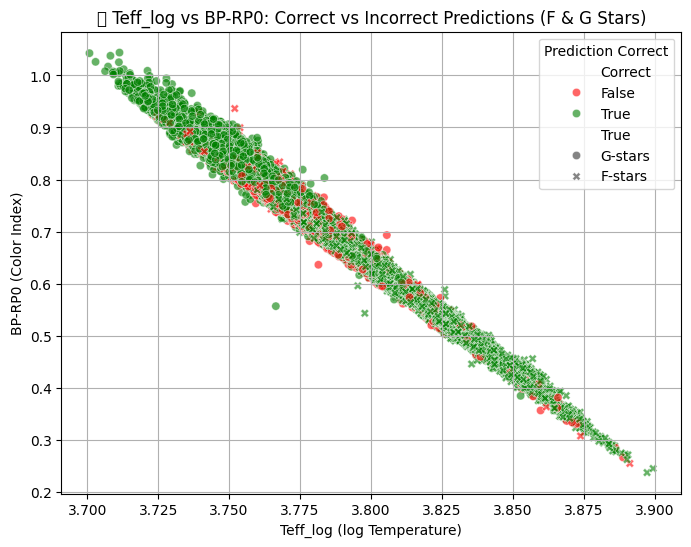

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df_fg,
    x='Teff_log'
    hue='Correct',
    style='True',
    palette={True: 'green', False: 'red'},
    alpha=0.6
)
plt.title("🌌 Teff_log vs BP-RP0: Correct vs Incorrect Predictions (F & G Stars)")
plt.xlabel("Teff_log (log Temperature)")
plt.ylabel("BP-RP0 (Color Index)")
plt.legend(title='Prediction Correct')
plt.grid(True)
plt.show()


In [ ]:
df_fg_reg = df[df['True'].isin(['F-stars', 'G-stars'])].copy()

# **Regression Validation of Feature-Target Linearity**
To verify that the model’s misclassifications stem from **feature overlap** rather than data quality issues, we conducted regression modeling on the F and G star subset.
#
 - The goal was to predict `Teff_log` (temperature) using other physical features like `BP-RP0`, `Lum-Flame-Log`, `logg`, `Rad-log`, and `GMAG`.
 - We trained multiple regressors including **Linear Regression**, **Ridge Regression**, **Random Forest Regressor**, and **XGBoost Regressor**.
 - Metrics such as **RMSE**, **R²**, and **cross-validated RMSE** were used to evaluate model fit.

 All models achieved exceptionally high R² scores (above 0.99), confirming that:
 - The relationship between stellar features and temperature is highly predictable.
 - The data quality is robust and consistent.

 This supports our claim that **model misclassifications occur due to feature similarity**, not noise or faulty data.


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
import xgboost as xgb
import numpy as np

# Step 1: Feature & target setup
features = ['BP-RP0', 'Lum-Flame-Log', 'logg', 'Rad-log', 'GMAG']
target = 'Teff_log'

X = df_fg_reg[features]
y = df_fg_reg[target]

# Step 2: Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Define models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'XGBoost': xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}

# Step 5: Train, predict, and evaluate
results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error')
    cv_rmse = np.sqrt(-cv_scores.mean())

    results[name] = {
        'RMSE': rmse,
        'R²': r2,
        'CV RMSE': cv_rmse,
        'predictions': y_pred
    }

    print(f"  {name} - RMSE: {rmse:.4f}, R²: {r2:.4f}, CV RMSE: {cv_rmse:.4f}")



Training Linear Regression...
  Linear Regression - RMSE: 0.0027, R²: 0.9921, CV RMSE: 0.0028

Training Ridge Regression...
  Ridge Regression - RMSE: 0.0027, R²: 0.9921, CV RMSE: 0.0028

Training Random Forest...
  Random Forest - RMSE: 0.0026, R²: 0.9931, CV RMSE: 0.0027

Training XGBoost...
  XGBoost - RMSE: 0.0027, R²: 0.9922, CV RMSE: 0.0029


# Precision-Recall Analysis for Threshold Optimization
To support the manual threshold tuning and make it data-driven, we analyze the **precision-recall tradeoff** for F-stars and G-stars.

- Precision-Recall (PR) curves are plotted separately for both F- and G-stars.
 - Each curve shows how precision and recall vary across different probability thresholds.
 - Red dots on the curves highlight selected thresholds (e.g., 0.45, 0.35, 0.25, etc.).

 The Area Under the PR Curve (AP) is also reported:
 - **F-stars**: AP = 0.888
 - **G-stars**: AP = 0.819

 These relatively high scores indicate that even with high class overlap, the model can rank instances well.

 Visualizing these curves gives valuable insight into choosing optimal thresholds that maximize performance on critical classes like F and G stars.

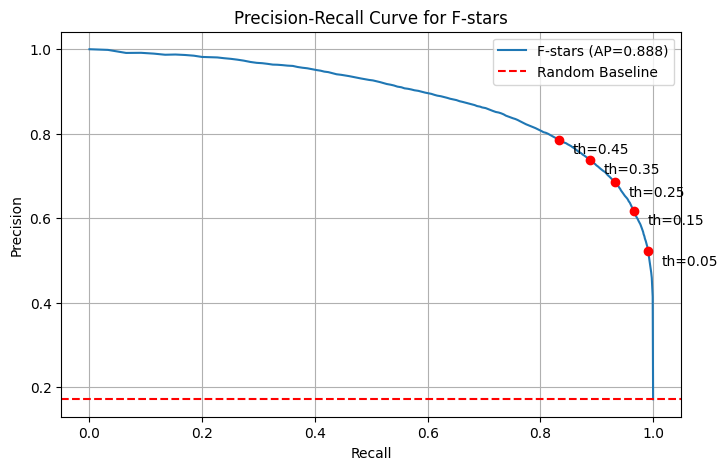

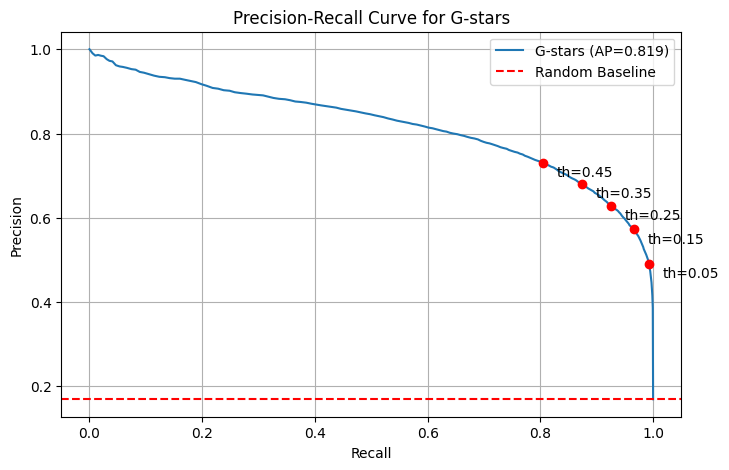

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score


y_proba = best_model.predict_proba(X_test_scaled)

def plot_pr_curve_for_class(class_name):

    class_index = np.where(label_encoder.classes_ == class_name)[0][0]


    y_true_binary = (y_test_encoded == class_index).astype(int)


    y_proba_class = y_proba[:, class_index]


    precision, recall, thresholds = precision_recall_curve(y_true_binary, y_proba_class)
    ap = average_precision_score(y_true_binary, y_proba_class)


    plt.figure(figsize=(8, 5))
    plt.plot(recall, precision, label=f'{class_name} (AP={ap:.3f})')


    threshold_indices = [10, 30, 50, 70, 90]
    for i in threshold_indices:
        if i < len(thresholds):
            plt.plot(recall[i], precision[i], 'ro')
            plt.annotate(f'th={thresholds[i]:.2f}', (recall[i], precision[i]),
                         xytext=(10, -10), textcoords='offset points')


    plt.axhline(y=sum(y_true_binary)/len(y_true_binary), color='r', linestyle='--', label='Random Baseline')
    plt.title(f'Precision-Recall Curve for {class_name}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid(True)
    plt.show()

# === Step 3: Plot for F-stars and G-stars ===
plot_pr_curve_for_class('F-stars')
plot_pr_curve_for_class('G-stars')


# **Custom Threshold Tuning for F vs G Star Classification**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier  # 🚨 make sure you have xgboost installed

# === Step 1: Prepare your data ===
# X = your features, y = your labels (e.g., star classes)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Encode class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
model.fit(X_train_scaled, y_train_encoded)


y_proba = model.predict_proba(X_test_scaled)


threshold_f = 0.35
threshold_g = 0.30

s
f_star_index = np.where(label_encoder.classes_ == 'F-stars')[0][0]
g_star_index = np.where(label_encoder.classes_ == 'G-stars')[0][0]


y_pred_custom = []

for i in range(len(y_proba)):
    prob_f = y_proba[i][f_star_index]
    prob_g = y_proba[i][g_star_index]

    if prob_f >= threshold_f:
        y_pred_custom.append(f_star_index)
    elif prob_g >= threshold_g:
        y_pred_custom.append(g_star_index)
    else:
        y_pred_custom.append(np.argmax(y_proba[i]))

y_pred_custom = np.array(y_pred_custom)


print("\n Classification Report with XGBoost and Custom Thresholds:")
print(classification_report(y_test_encoded, y_pred_custom, target_names=label_encoder.classes_))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [23:48:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



📊 Classification Report with XGBoost and Custom Thresholds:
              precision    recall  f1-score   support

     A-stars       0.98      0.97      0.98     18861
     B-stars       0.99      0.98      0.98     13857
     F-stars       0.74      0.88      0.81     18998
     G-stars       0.76      0.68      0.72     18833
     K-stars       0.94      0.87      0.90     19815
     M-stars       0.98      0.97      0.97     18212
     O-stars       0.94      0.98      0.96      2965

    accuracy                           0.89    111541
   macro avg       0.90      0.91      0.90    111541
weighted avg       0.89      0.89      0.89    111541

